# Описание данных

* `Snap_date` - дата начала месяца туризма
* `Id_hash` - id абонента. Один абонент может встречаться несколько раз в разных месяцах или городах
* `days` - продолжительность присутствия в днях в точке туризма 
* `home_region` - номер домашнего региона 
* `city` - точка туризма 
* `gender` - предсказанный моделью пол абонента. 
> * 1 – мужчина;
> * 2 – женщина;
> * 3 – неизвестно;
* `age` - предсказанный моделью возраст абонента в годах 
* `mou` - голосовой трафик абонента за месяц (snap_date) в минутах 
* `mou_out` - исходящий голосовой трафик абонента за месяц в минутах 
* `dou` - интернет-трафик абонента за месяц, МБ
* `Interests` - список интересов абонента за месяц snap_date 
* `top_service` - url, по которому у абонента больше всего трафика за месяц 
* `volume_sum` - трафик абонента за время присутствия в точке туризма, МБ
* `dl/ul_volume_sum` - разложение volume_sum на uplink, downlink, МБ
* `Column_1` - служебное поле, не информативное

In [11]:
import pandas as pd
import numpy as np
from scipy import stats as st
import math as mth
import calendar

import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

import datetime as dt
from datetime import datetime, timedelta

from pandas_profiling import ProfileReport

## Чтение файлов

In [12]:
path_local_21 = '/kaggle/input/spgu-olimp/Олимпиада для первых_2023 материалы/Кейс, критерии и данные для кейса/Данные_2021/'
csv_files_21 = ['Tourists_Абинск_2021.csv', 'Tourists_Александров_2021.csv', 'Tourists_Армавир_2021.csv',
             'Tourists_Байкальск_2021.csv', 'Tourists_Белореченск_2021.csv', 'Tourists_Вязники_2021.csv', 
             'Tourists_Горно-Алтайск_2021.csv', 'Tourists_Городищи_2021.csv', 'Tourists_Гороховец_2021.csv',
             'Tourists_Горячий Ключ_2021.csv', 'Tourists_Гулькевичи_2021.csv', 'Tourists_Ейск_2021.csv', 
             'Tourists_Ковров_2021.csv', 'Tourists_Кольчугино_2021.csv', 'Tourists_Кореновск_2021.csv', 
             'Tourists_Кропоткин_2021.csv', 'Tourists_Крымск_2021.csv', 'Tourists_Курганинск_2021.csv',
             'Tourists_Лабинск_2021.csv', 'Tourists_Лакинск_2021.csv', 'Tourists_Меленки_2021.csv', 
             'Tourists_Муром_2021.csv', 'Tourists_Новокубанск_2021.csv', 'Tourists_Петушки_2021.csv',
             'Tourists_Покров_2021.csv', 'Tourists_Сириус_2021.csv', 'Tourists_Славянск-на-Кубани_2021.csv', 
             'Tourists_Сортавала_2021.csv', 'Tourists_Струнино_2021.csv', 'Tourists_Темрюк_2021.csv', 
             'Tourists_Тимашевск_2021.csv', 'Tourists_Тихорецк_2021.csv', 'Tourists_Туапсе_2021.csv', 
             'Tourists_Усть-Лабинск_2021.csv', 'Tourists_Хадыженск_2021.csv', 'Tourists_Юрьев-Польский_2021.csv']

df_2021 = pd.read_csv(path_local_21 + 'Tourists_Абинск_2021.csv')
for file in csv_files_21:
    if file != 'Tourists_Абинск_2021.csv':
        df = pd.read_csv(f'{path_local_21}{file}')
        df_2021 = pd.concat([df_2021, df], ignore_index=True)
        
df_2021 = df_2021.drop(columns=['Unnamed: 0'])     
        
    
path_local_22 = '/kaggle/input/spgu-olimp/Олимпиада для первых_2023 материалы/Кейс, критерии и данные для кейса/Данные_2022/'
csv_files_22 = ['Tourists_Абинск_2022.csv', 'Tourists_Александров_2022.csv', 'Tourists_Армавир_2022.csv',
             'Tourists_Байкальск_2022.csv', 'Tourists_Белореченск_2022.csv', 'Tourists_Вязники_2022.csv',
             'Tourists_Горно-Алтайск_2022.csv', 'Tourists_Городищи_2022.csv', 'Tourists_Гороховец_2022.csv',
             'Tourists_Горячий Ключ_2022.csv', 'Tourists_Гулькевичи_2022.csv', 'Tourists_Ейск_2022.csv',
             'Tourists_Ковров_2022.csv', 'Tourists_Кольчугино_2022.csv', 'Tourists_Кореновск_2022.csv',
             'Tourists_Кропоткин_2022.csv', 'Tourists_Крымск_2022.csv', 'Tourists_Курганинск_2022.csv',
             'Tourists_Лабинск_2022.csv', 'Tourists_Лакинск_2022.csv', 'Tourists_Меленки_2022.csv',
             'Tourists_Муром_2022.csv', 'Tourists_Новокубанск_2022.csv', 'Tourists_Петушки_2022.csv',
             'Tourists_Покров_2022.csv', 'Tourists_Сириус_2022.csv', 'Tourists_Славянск-на-Кубани_2022.csv',
             'Tourists_Сортавала_2022.csv', 'Tourists_Струнино_2022.csv', 'Tourists_Темрюк_2022.csv',
             'Tourists_Тимашевск_2022.csv', 'Tourists_Тихорецк_2022.csv', 'Tourists_Туапсе_2022.csv',
             'Tourists_Усть-Лабинск_2022.csv', 'Tourists_Хадыженск_2022.csv', 'Tourists_Юрьев-Польский_2022.csv']

df_2022 = pd.read_csv(path_local_22 + 'Tourists_Абинск_2022.csv')
for file in csv_files_22:
    if file != 'Tourists_Абинск_2022.csv':
        df = pd.read_csv(f'{path_local_22}{file}')
        df_2022 = pd.concat([df_2022, df], ignore_index=True)
        
df_2022 = df_2022.drop(columns=['Unnamed: 0'])     


df_2021['snap_date_datetime'] = pd.to_datetime(df_2021['snap_date'])
df_2022['snap_date_datetime'] = pd.to_datetime(df_2022['snap_date'])

In [13]:
df_2021['month'] = df_2021['snap_date_datetime'].dt.month
df_2021['year'] = df_2021['snap_date_datetime'].dt.year
df_2021['month_name'] = df_2021['snap_date_datetime'].dt.strftime('%B')

df_2022['month'] = df_2022['snap_date_datetime'].dt.month
df_2022['year'] = df_2022['snap_date_datetime'].dt.year
df_2022['month_name'] = df_2022['snap_date_datetime'].dt.strftime('%B')

df_2021['age'] = df_2021['age'].apply(lambda x: 0 if x > 99 or x < 0 else x)
df_2022['age'] = df_2022['age'].apply(lambda x: 0 if x > 99 or x < 0 else x)

In [14]:
print("2021 shape: ", df_2021.shape)
print("2021 shape: ", df_2022.shape)

2021 shape:  (3884691, 15)
2021 shape:  (3818880, 20)


## Временные ряды

In [15]:
# Создаем список городов
eng_cities = ['Abinsk', 'Alexandrov', 'Armavir', 'Baikalsk', 'Belorechensk',
       'Vyazniki', 'Gorno-Altaisk', 'Gorodishchi', 'Gorokhovets',
       'Hot Key', 'Gulkevichi', 'Yeisk', 'Kovrov', 'Kolchugino',
       'Korenovsk', 'Kropotkin', 'Krymsk', 'Kurganinsk', 'Labinsk',
       'Lakinsk', 'Melenki', 'Murom', 'Novokubansk', 'Petushki', 'Pokrov',
       'Sirius', 'Slavyansk-on-Kuban', 'Sortavala', 'Strunino', 'Temryuk',
       'Timashevsk', 'Tikhoretsk', 'Tuapse', 'Ust-Labinsk', 'Khadyzhensk',
       'Yuriev-Polsky']

cities = ['Абинск', 'Александров', 'Армавир', 'Байкальск', 'Белореченск',
       'Вязники', 'Горно-Алтайск', 'Городищи', 'Гороховец',
       'Горячий Ключ', 'Гулькевичи', 'Ейск', 'Ковров', 'Кольчугино',
       'Кореновск', 'Кропоткин', 'Крымск', 'Курганинск', 'Лабинск',
       'Лакинск', 'Меленки', 'Муром', 'Новокубанск', 'Петушки', 'Покров',
       'Сириус', 'Славянск-на-Кубани', 'Сортавала', 'Струнино', 'Темрюк',
       'Тимашевск', 'Тихорецк', 'Туапсе', 'Усть-Лабинск', 'Хадыженск',
       'Юрьев-Польский']

# Создаем цикл, который будет проходить по каждому городу и создавать переменную с данными из двух датафреймов
for city, r_city in zip(eng_cities, cities):
    globals()[city] = pd.concat([df_2021[df_2021['city'] == r_city], df_2022[df_2022['city'] == r_city]])



In [16]:
lens_list = []
for city in eng_cities:
    lens_list.append((city, globals()[city].shape[0]))
    
lens_list.sort(key=lambda x: x[1], reverse=True)
lens_list

[('Sirius', 864617),
 ('Hot Key', 833511),
 ('Korenovsk', 635512),
 ('Timashevsk', 512881),
 ('Tuapse', 496418),
 ('Temryuk', 441716),
 ('Slavyansk-on-Kuban', 369452),
 ('Tikhoretsk', 308509),
 ('Krymsk', 263088),
 ('Armavir', 232276),
 ('Kropotkin', 209706),
 ('Gorokhovets', 194968),
 ('Pokrov', 190393),
 ('Lakinsk', 189874),
 ('Novokubansk', 174144),
 ('Vyazniki', 162440),
 ('Petushki', 152024),
 ('Murom', 143472),
 ('Abinsk', 112819),
 ('Ust-Labinsk', 112477),
 ('Gorno-Altaisk', 107472),
 ('Belorechensk', 107387),
 ('Yeisk', 103193),
 ('Alexandrov', 102225),
 ('Gulkevichi', 96322),
 ('Baikalsk', 84722),
 ('Kurganinsk', 77929),
 ('Strunino', 75328),
 ('Kovrov', 58963),
 ('Sortavala', 56610),
 ('Labinsk', 54416),
 ('Gorodishchi', 53052),
 ('Khadyzhensk', 49197),
 ('Yuriev-Polsky', 35710),
 ('Kolchugino', 22068),
 ('Melenki', 18680)]

# ну а теперь СЕРЬЁЗНАЯ АНАЛИТИКА(я умею программировать)

![](https://i.pinimg.com/736x/f4/d2/96/f4d2961b652880be432fb9580891ed62.jpg)

In [18]:
df = pd.concat([df_2021, df_2022], ignore_index=True)

# Построим ряды описывающие среднее использование связи и интернета в городах на каждый месяц

Так же добавим на ряды праздники

In [19]:
import holidays



holidays_m = set([date[0].month for date in holidays.RU(years=[2022]).items()])
df['is_holiday'] = df.month.isin(holidays_m)
h_dates = df[df['is_holiday'] == True].snap_date.unique()

Графики для Abinsk


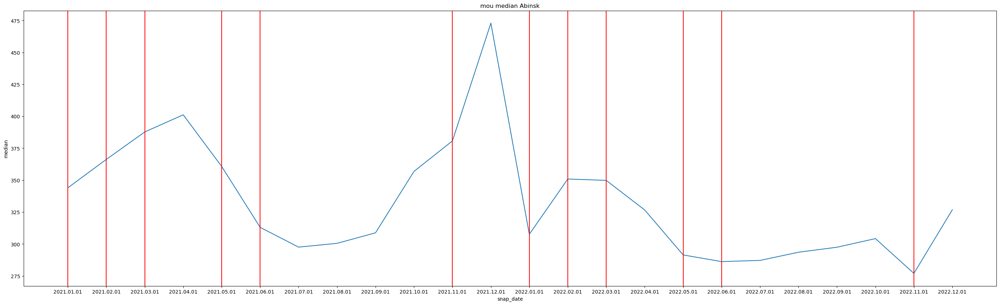

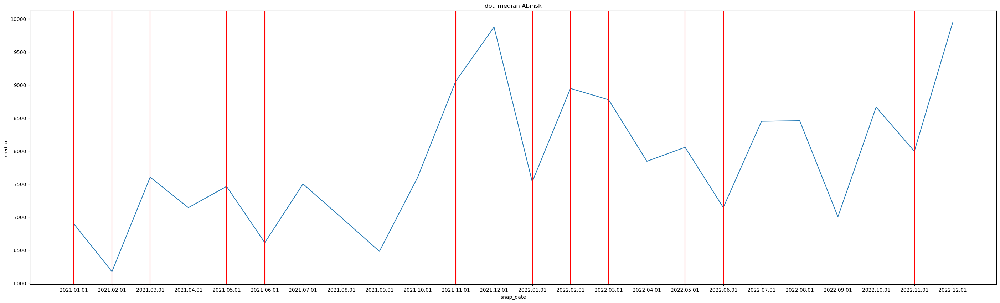

Графики для Alexandrov


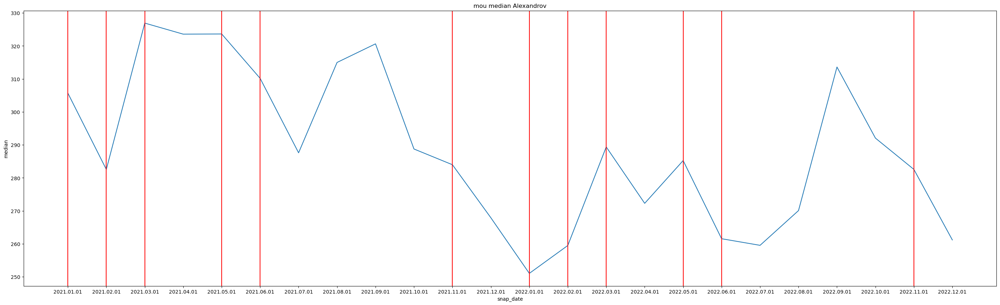

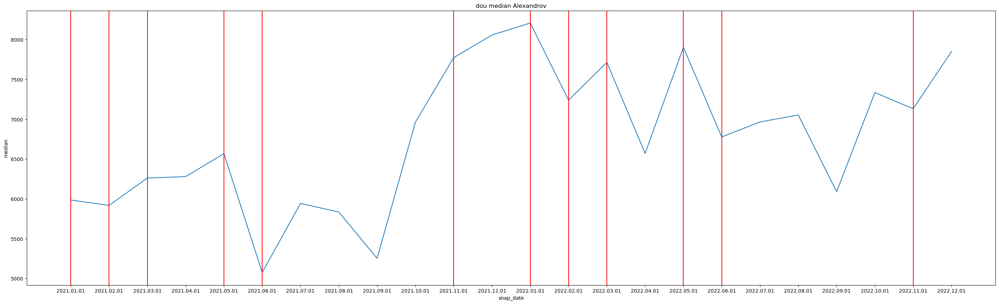

Графики для Armavir


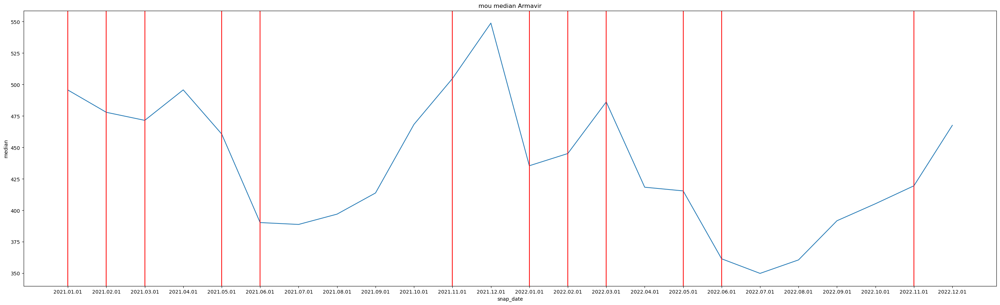

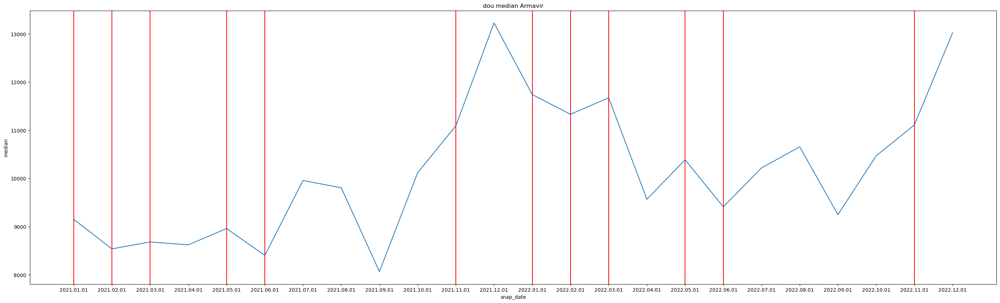

Графики для Baikalsk


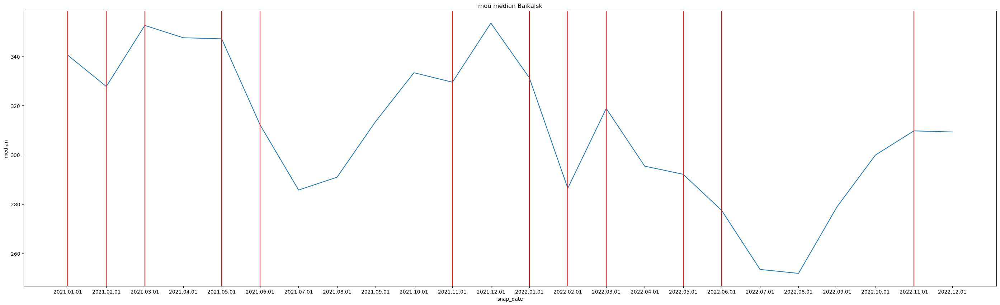

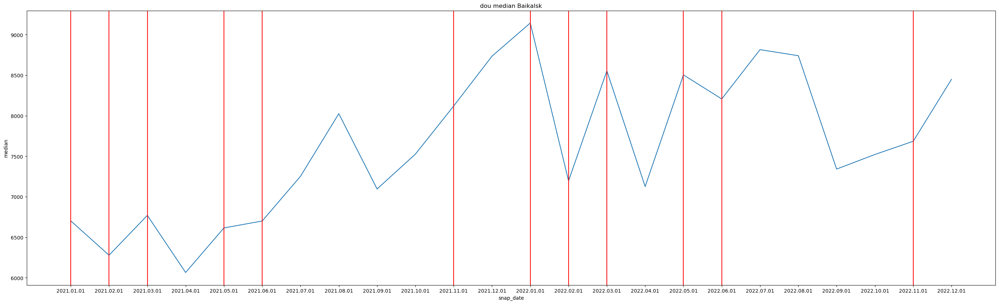

Графики для Belorechensk


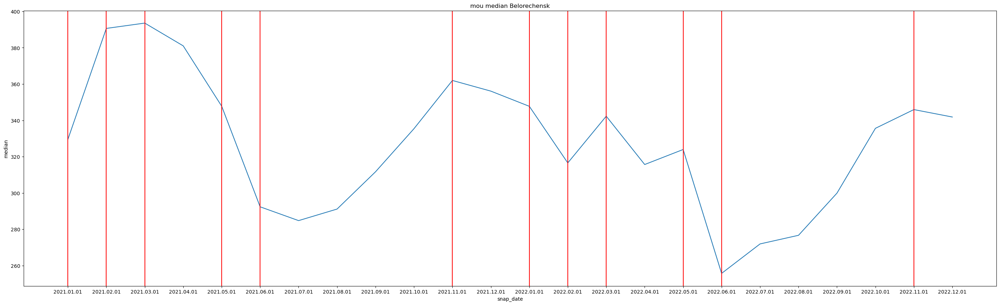

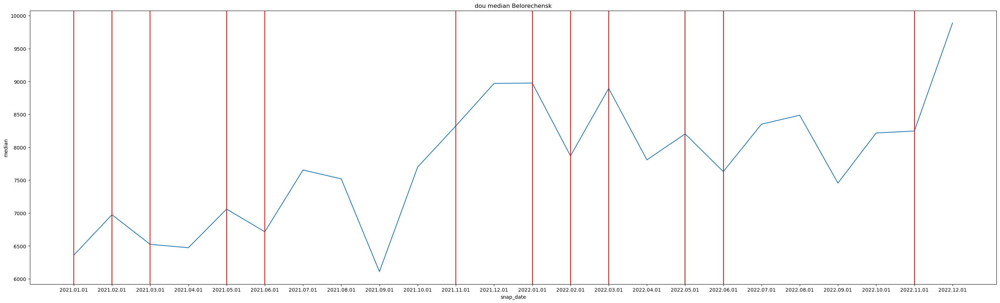

Графики для Vyazniki


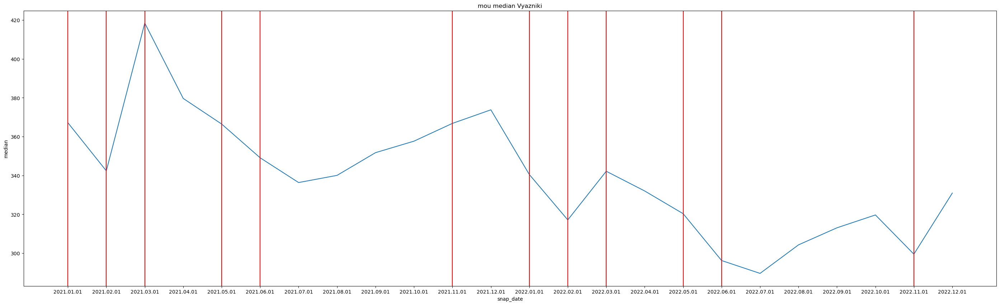

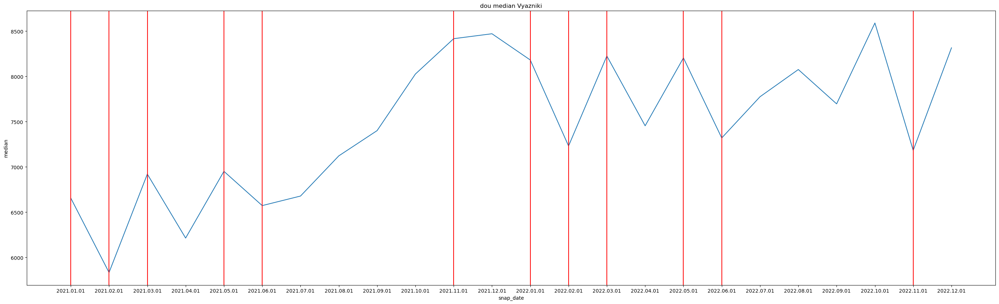

Графики для Gorno-Altaisk


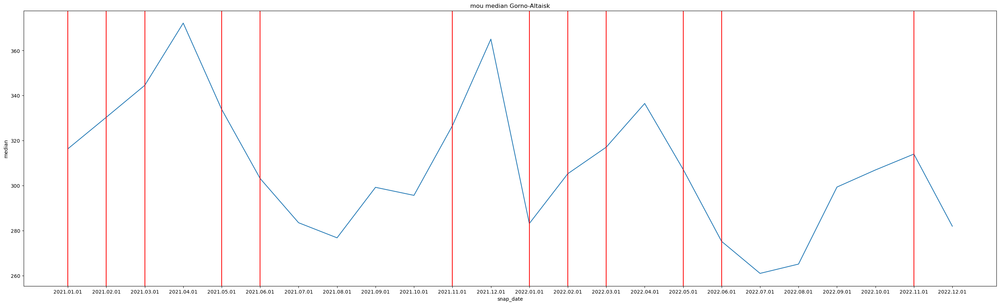

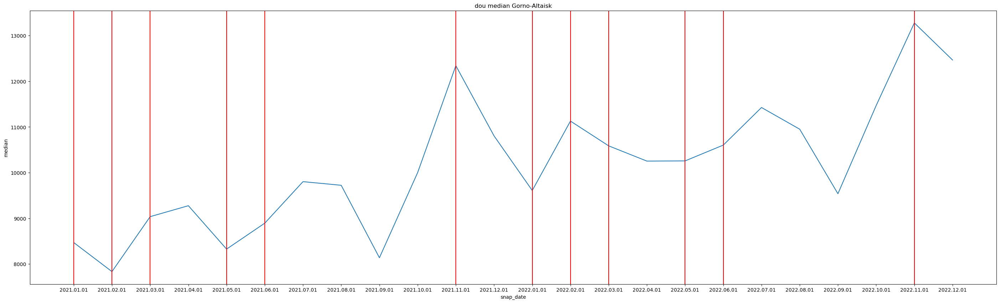

Графики для Gorodishchi


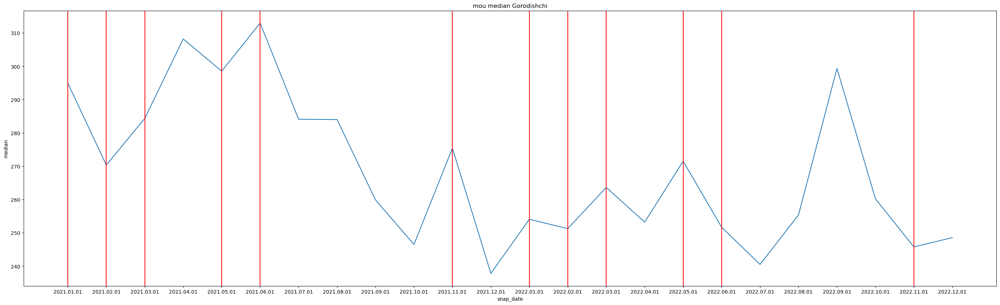

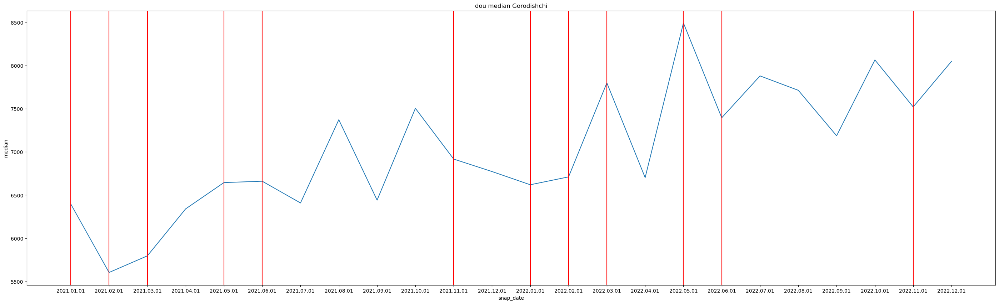

Графики для Gorokhovets


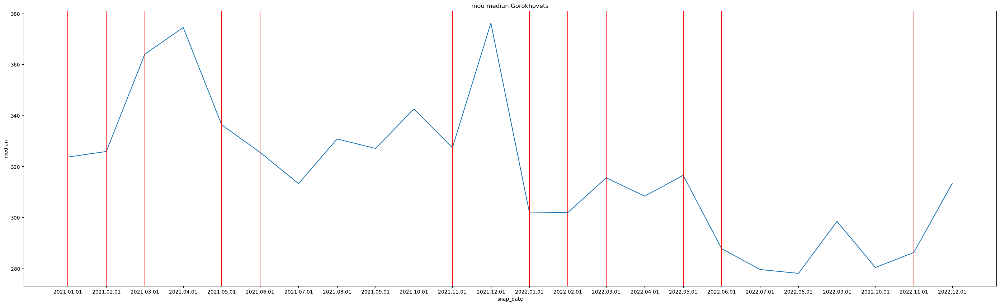

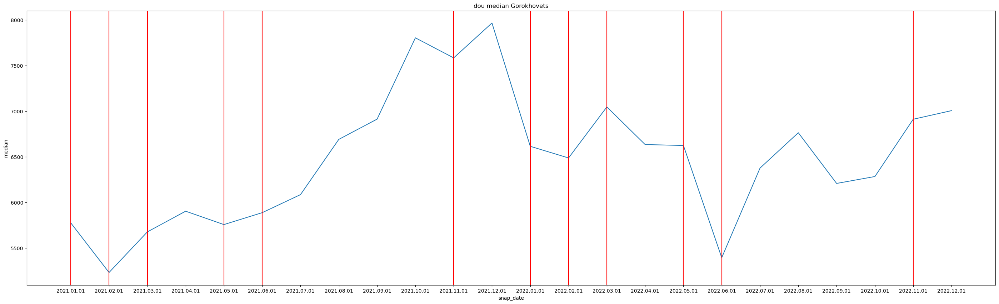

Графики для Hot Key


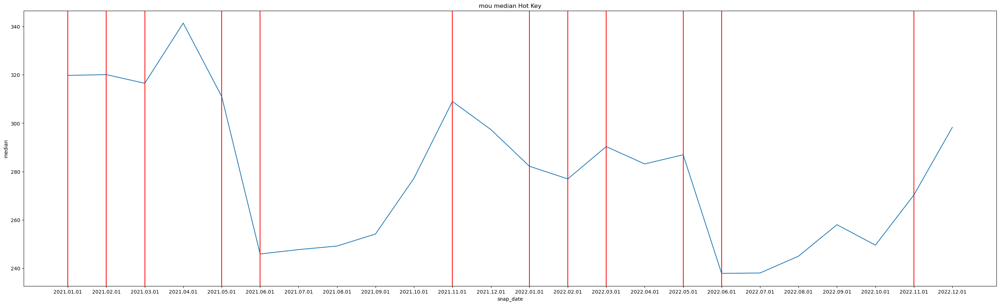

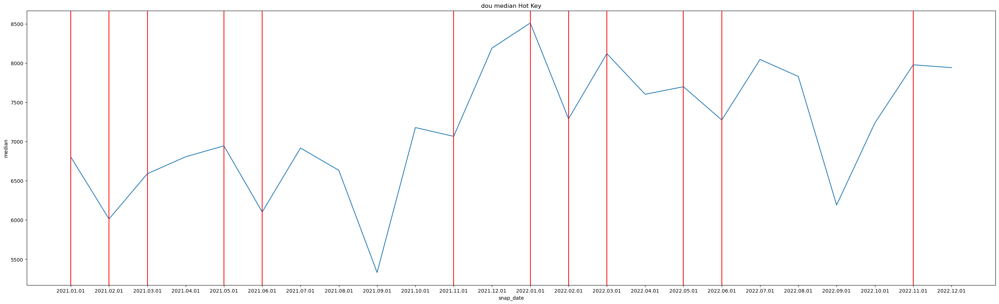

Графики для Gulkevichi


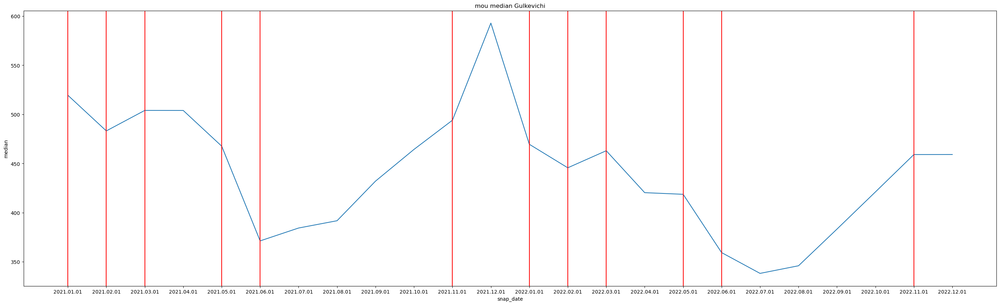

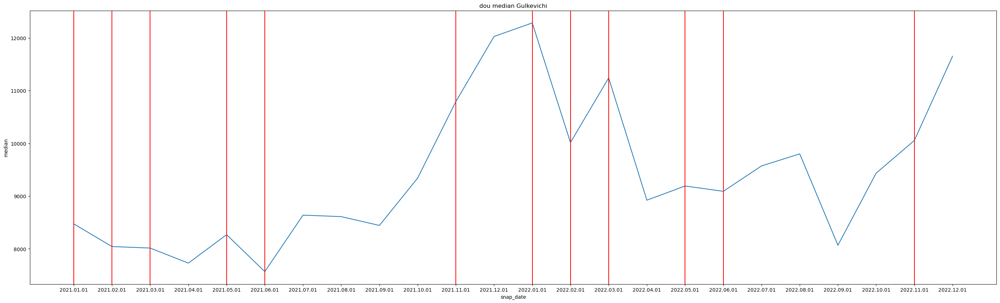

Графики для Yeisk


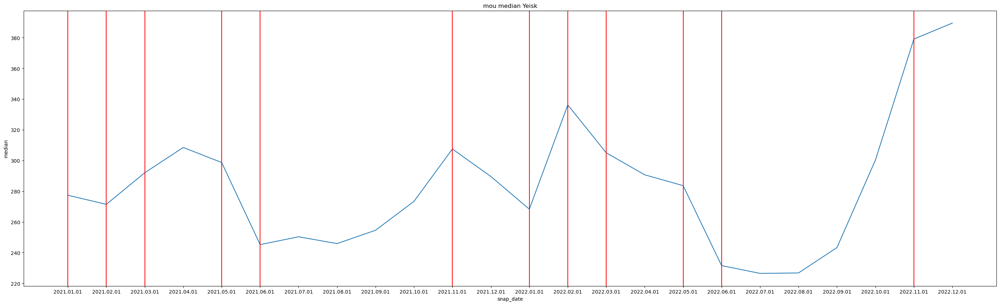

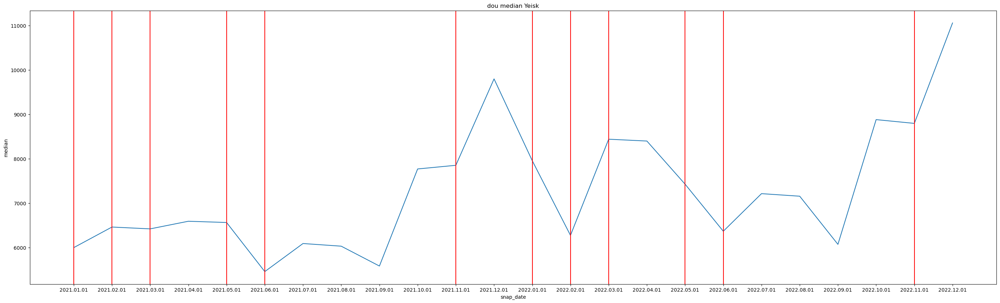

Графики для Kovrov


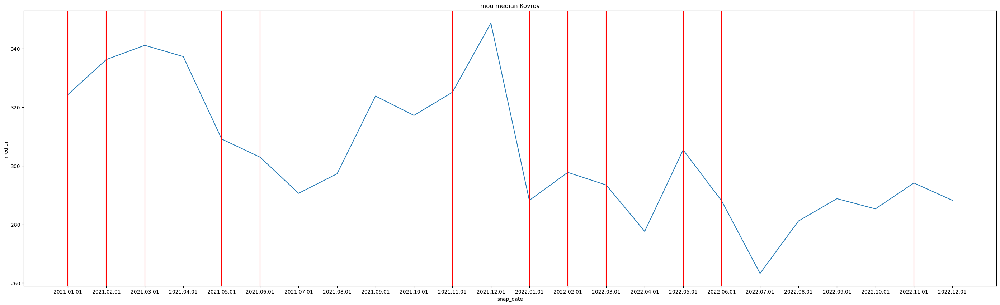

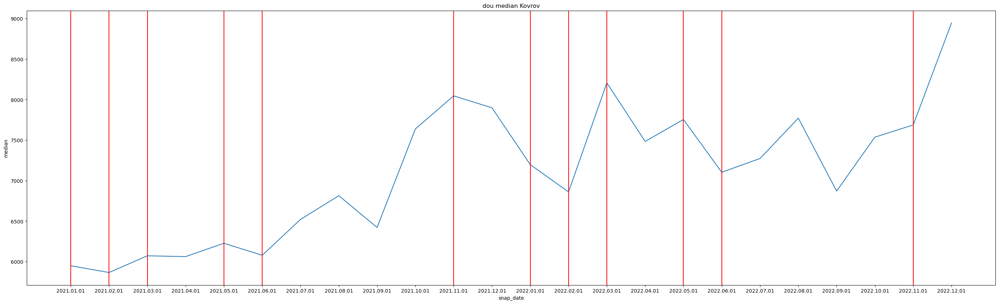

Графики для Kolchugino


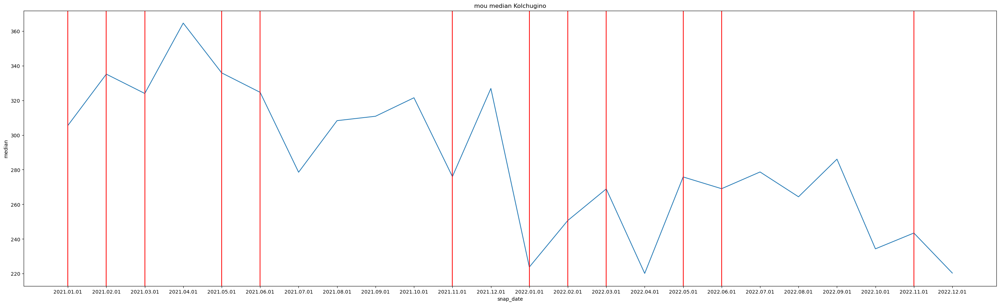

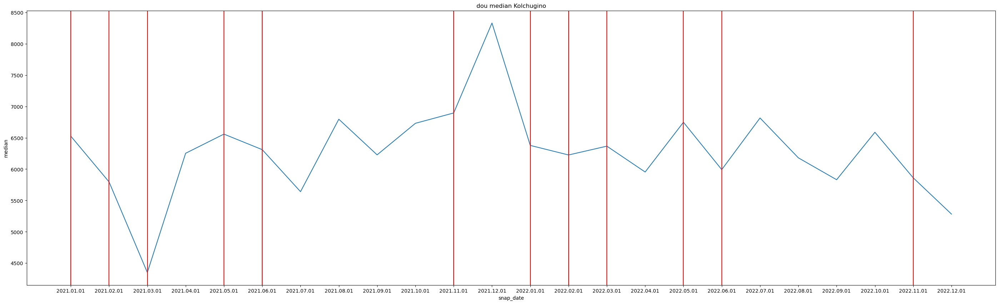

Графики для Korenovsk


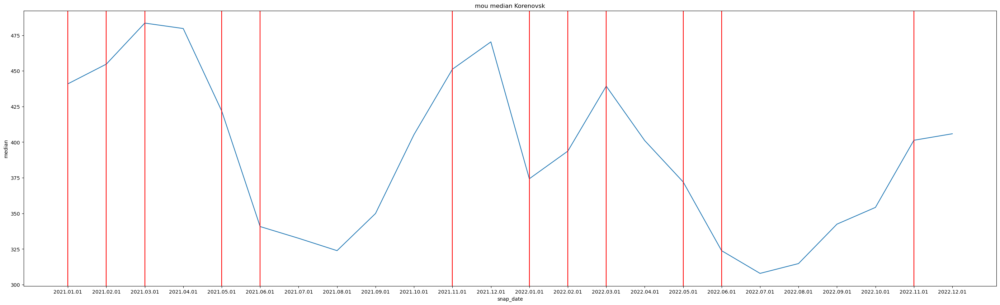

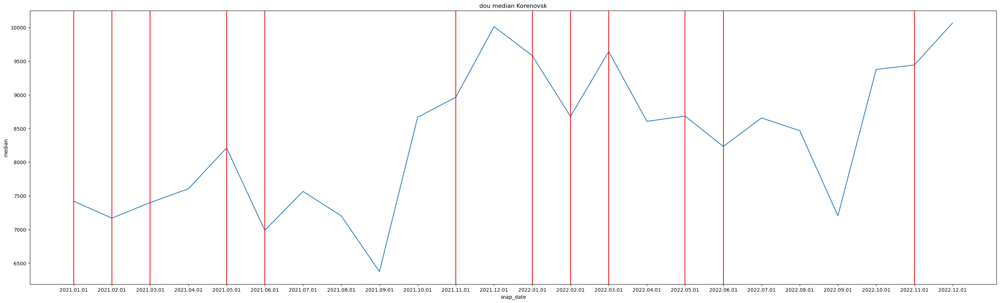

Графики для Kropotkin


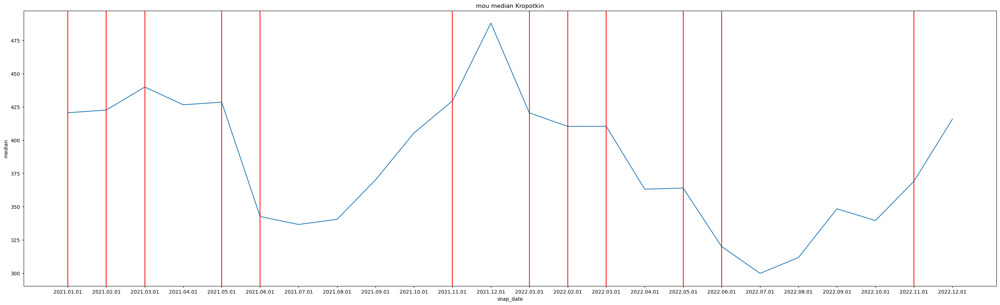

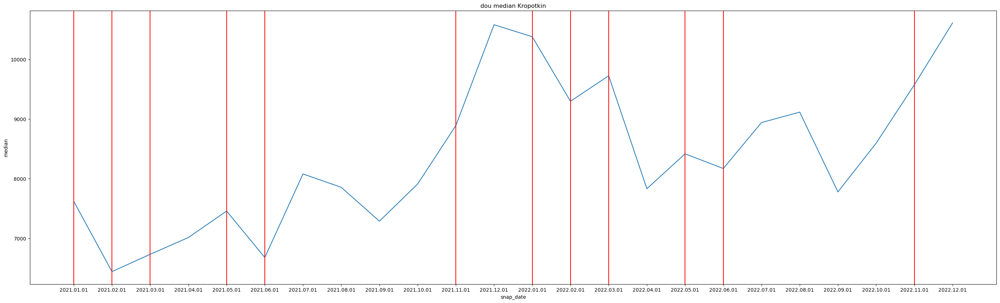

Графики для Krymsk


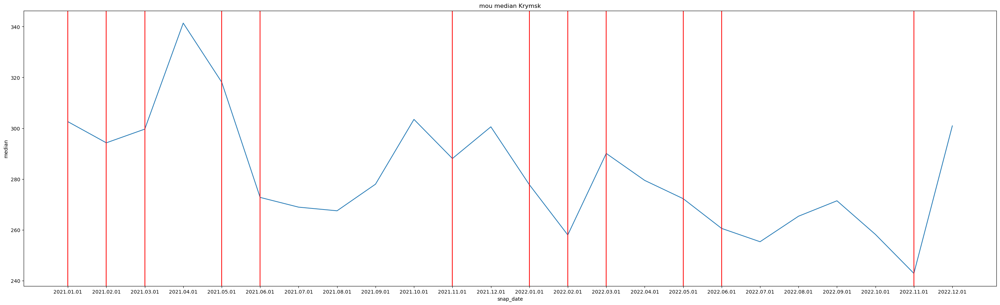

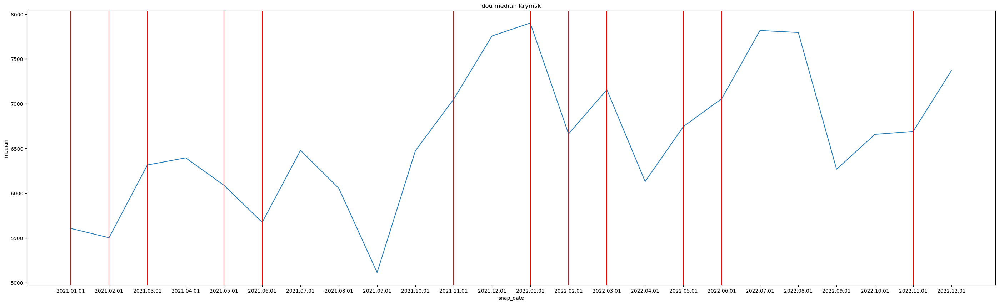

Графики для Kurganinsk


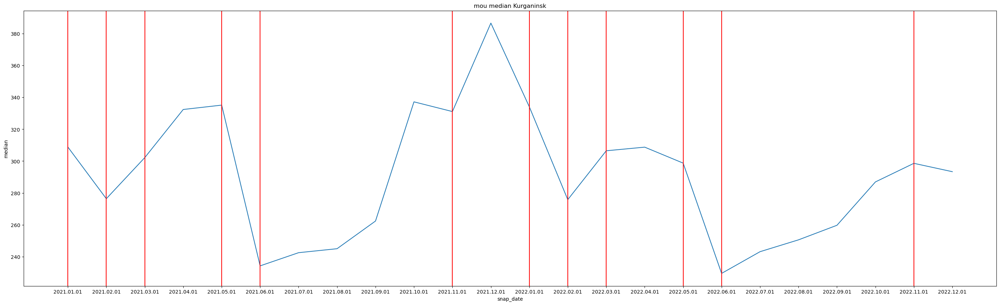

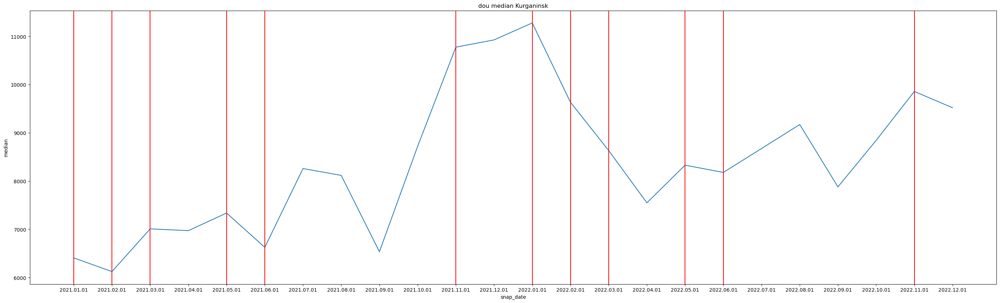

Графики для Labinsk


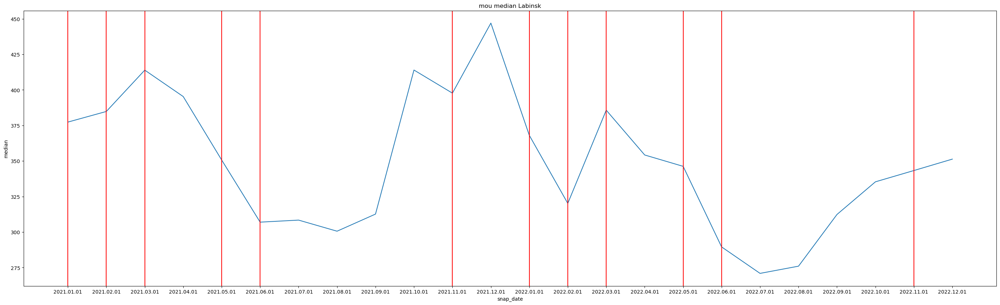

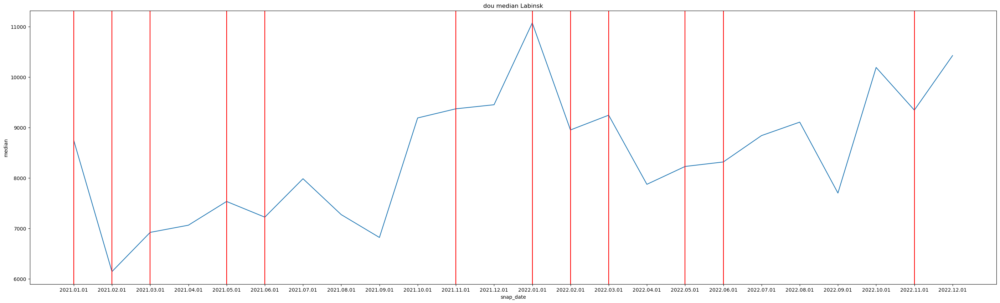

Графики для Lakinsk


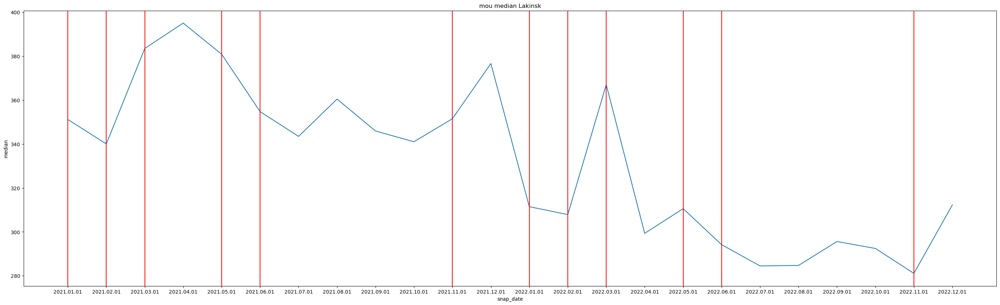

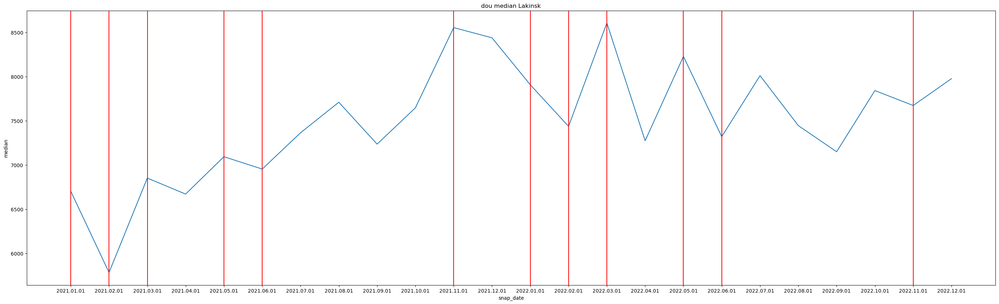

Графики для Melenki


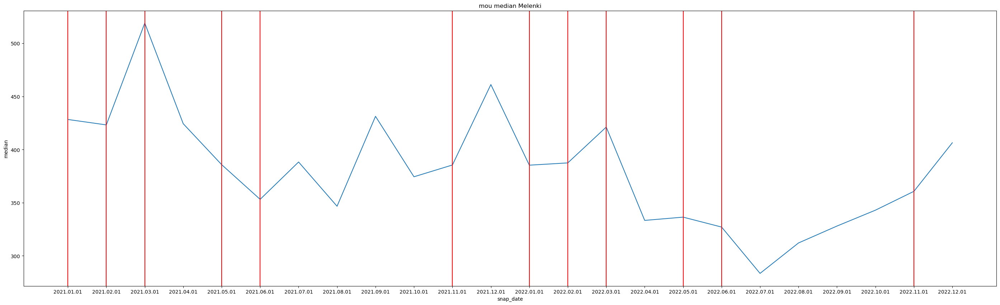

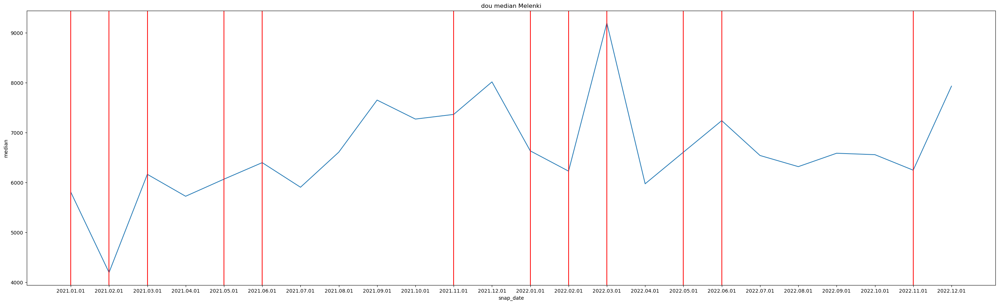

Графики для Murom


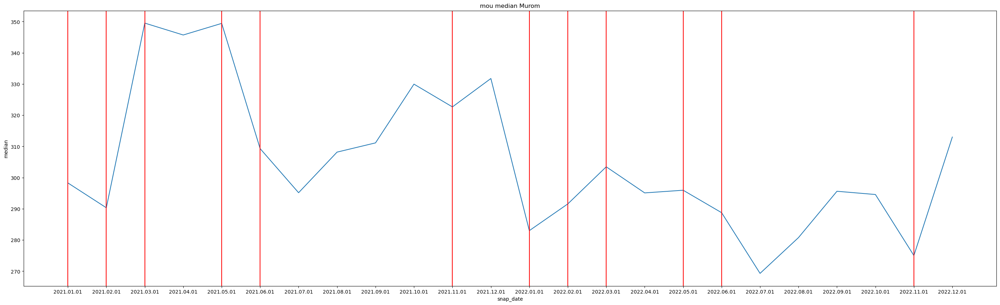

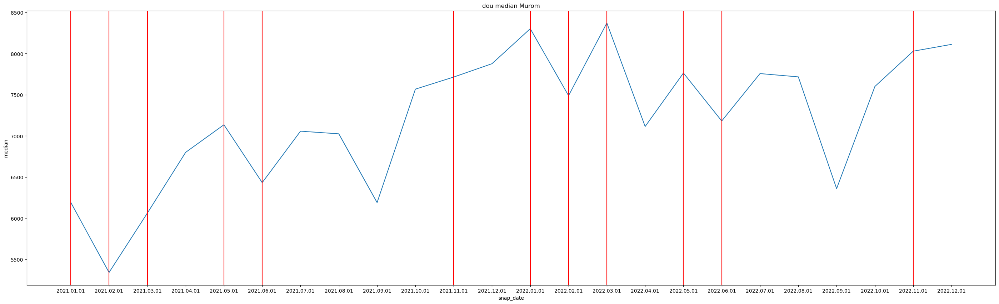

Графики для Novokubansk


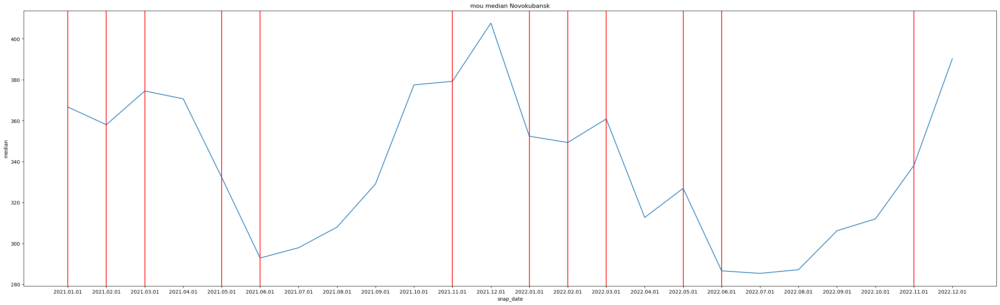

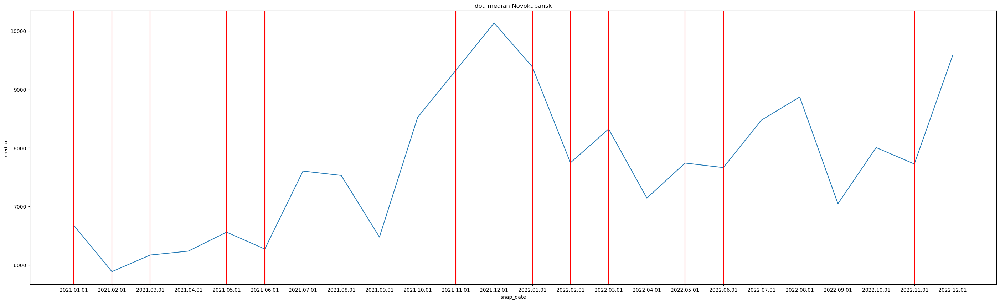

Графики для Petushki


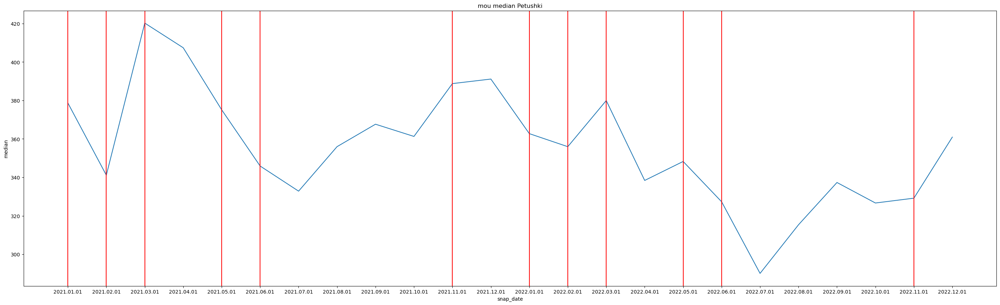

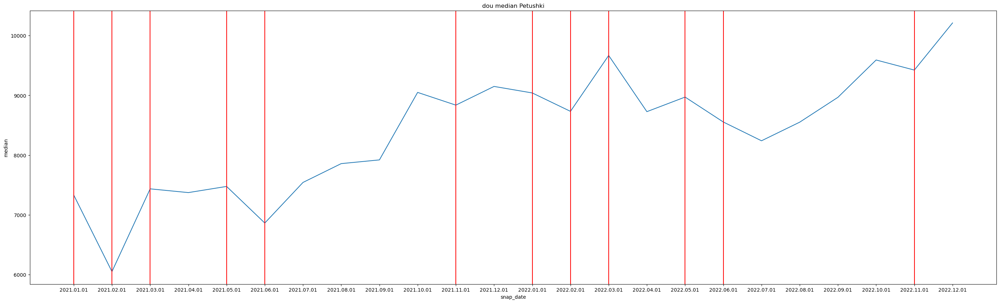

Графики для Pokrov


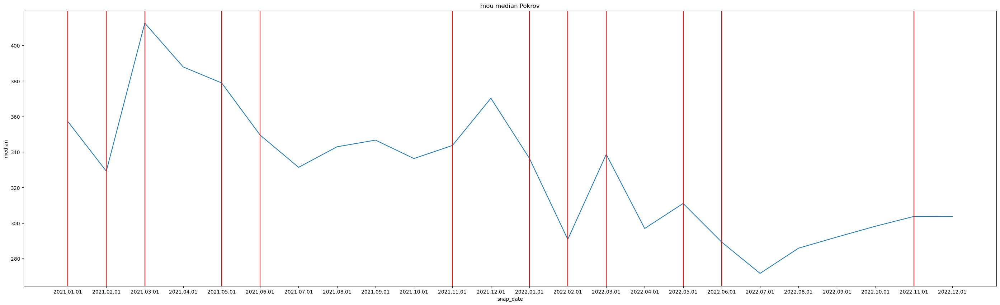

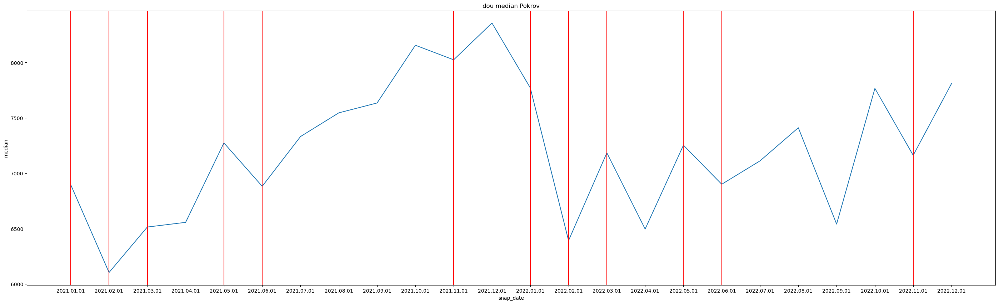

Графики для Sirius


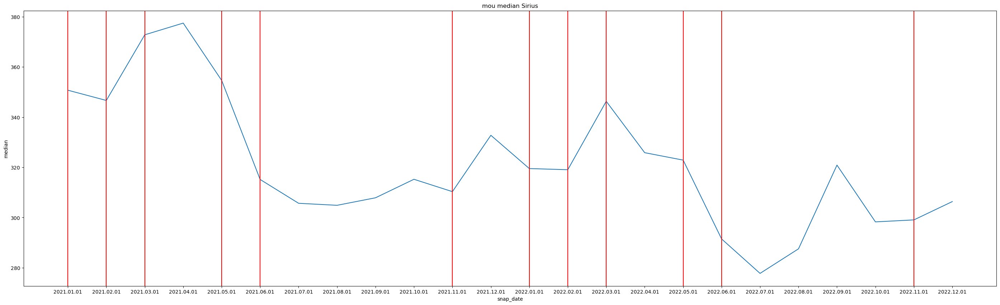

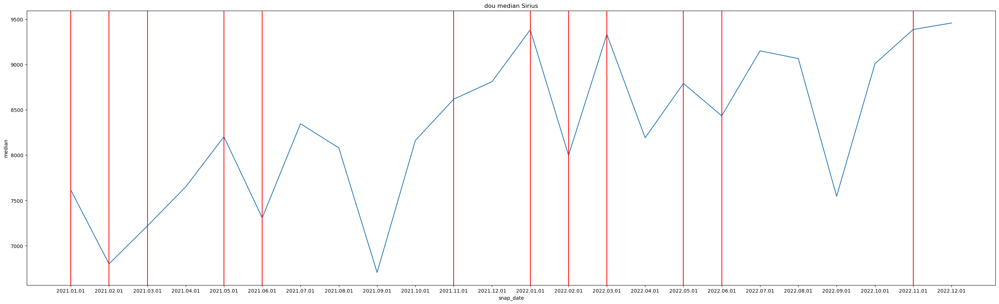

Графики для Slavyansk-on-Kuban


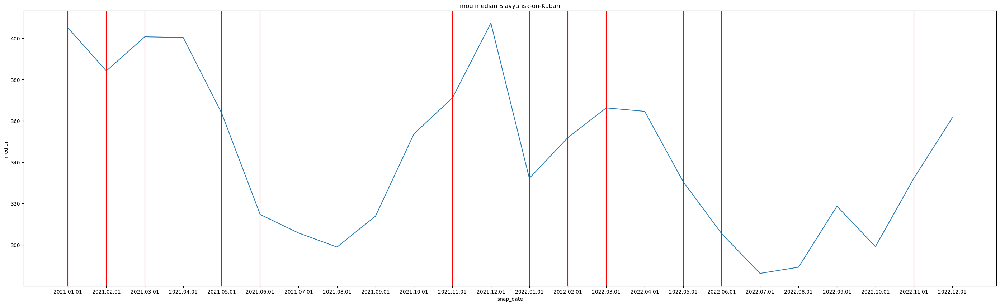

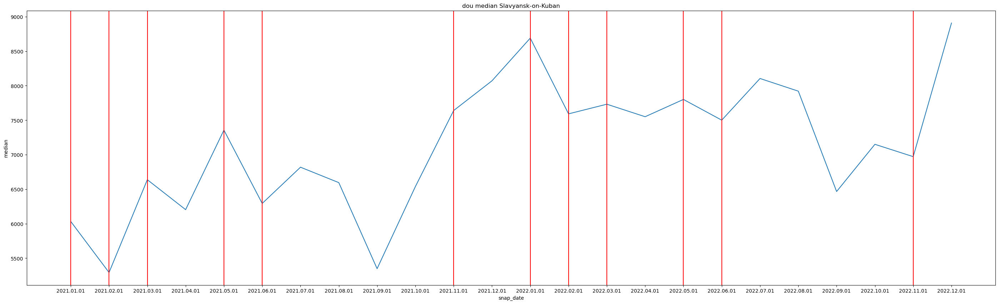

Графики для Sortavala


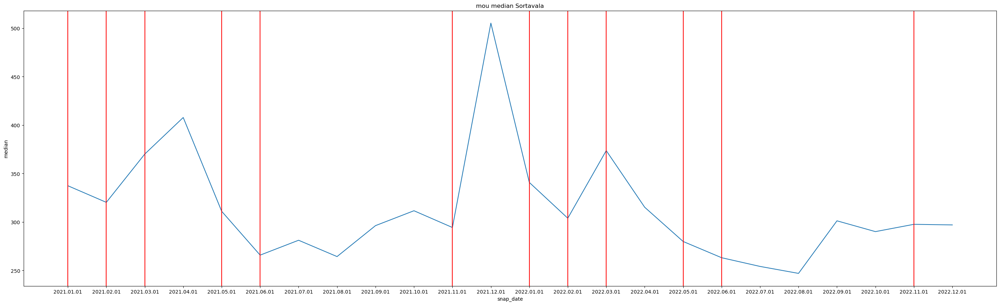

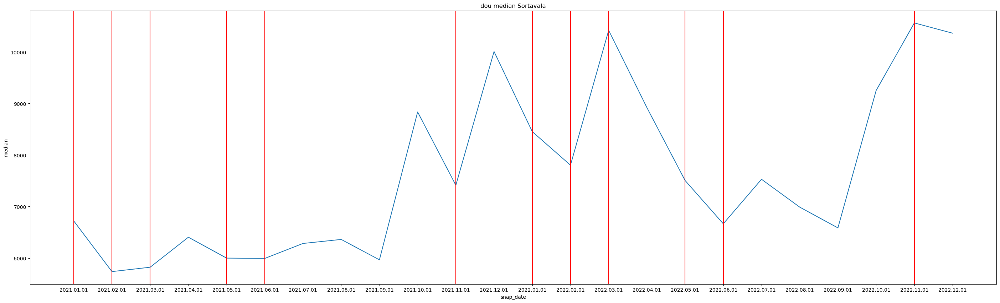

Графики для Strunino


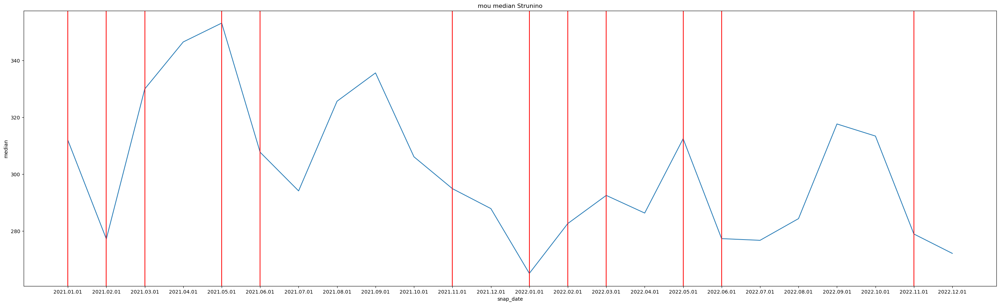

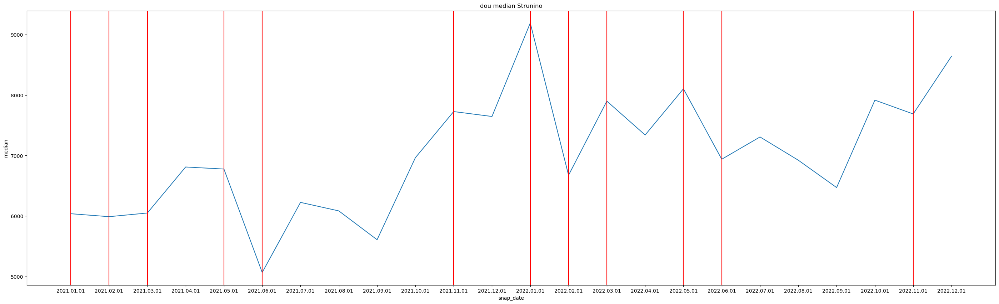

Графики для Temryuk


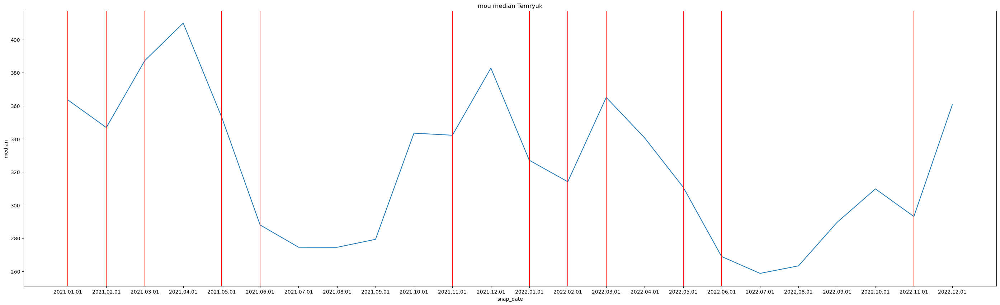

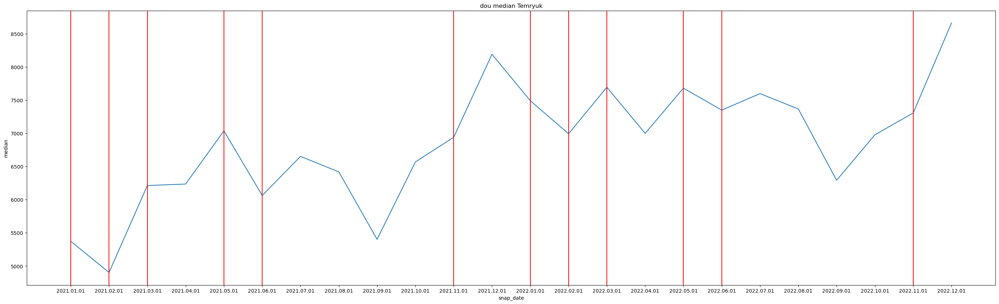

Графики для Timashevsk


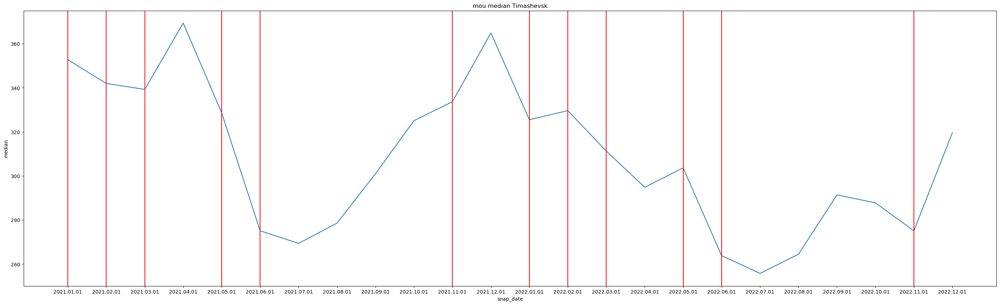

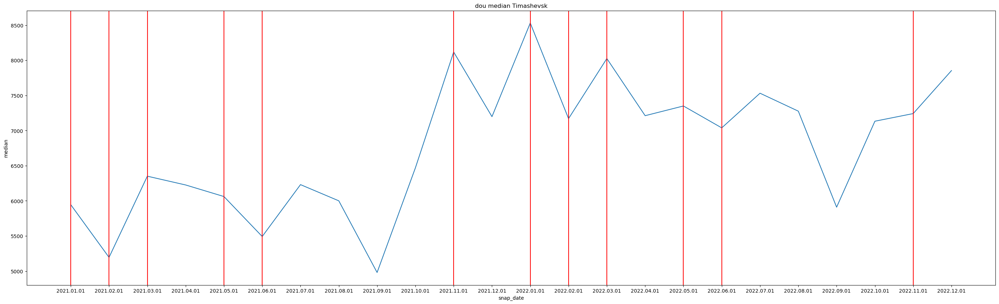

Графики для Tikhoretsk


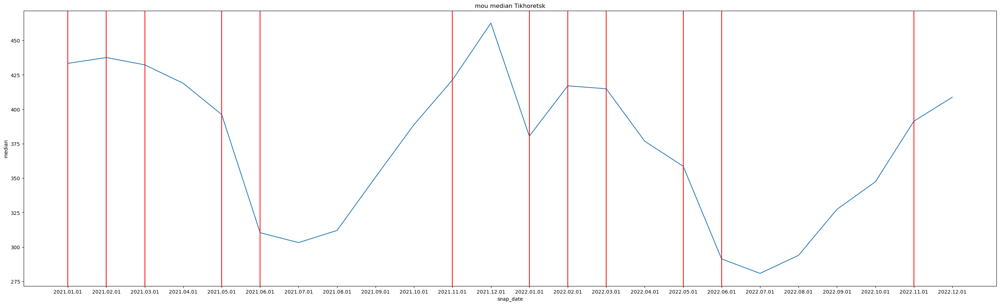

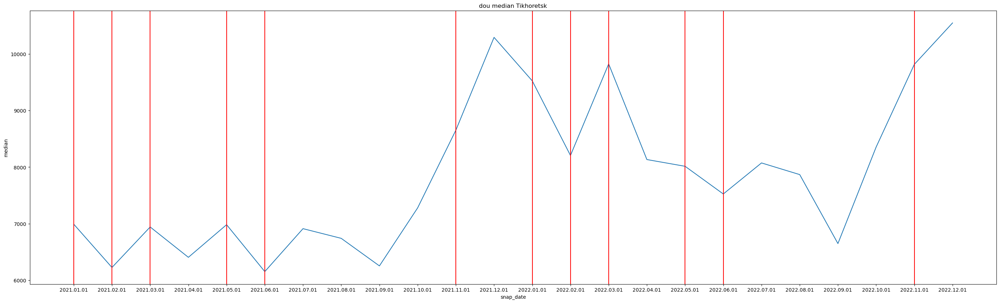

Графики для Tuapse


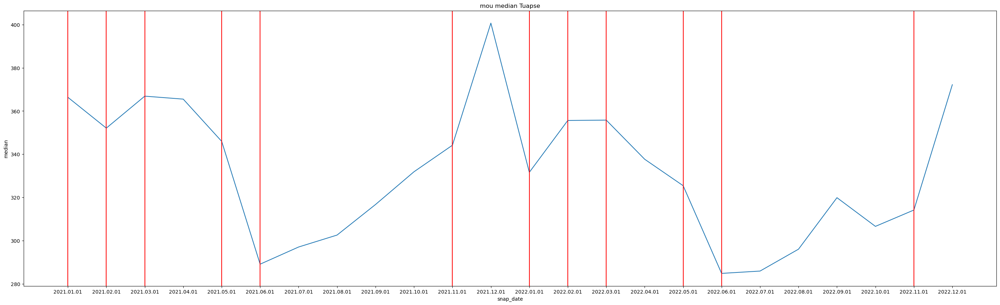

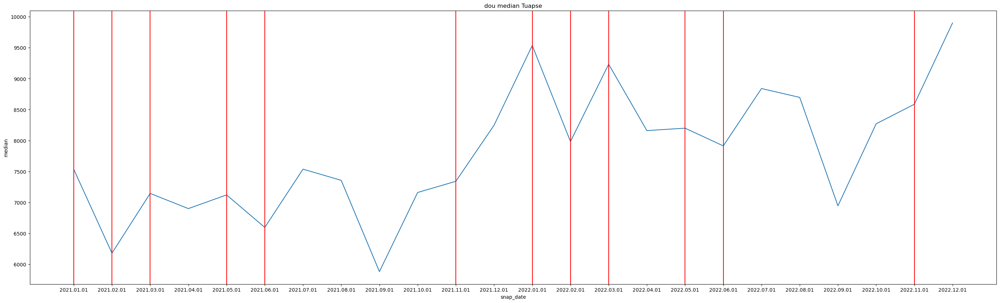

Графики для Ust-Labinsk


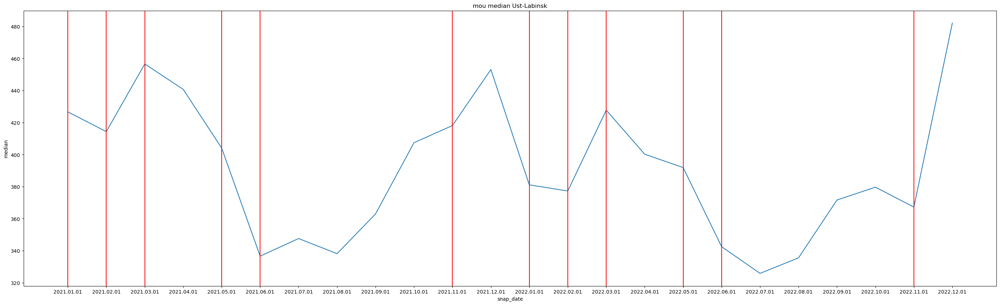

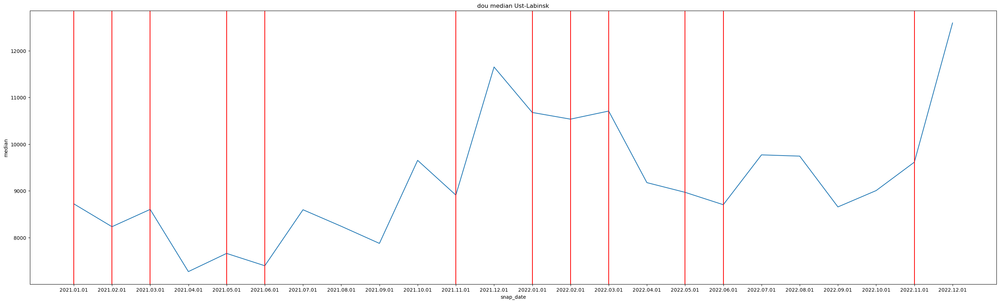

Графики для Khadyzhensk


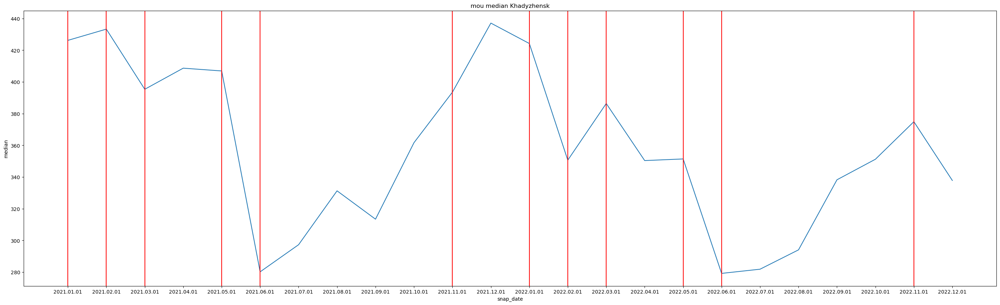

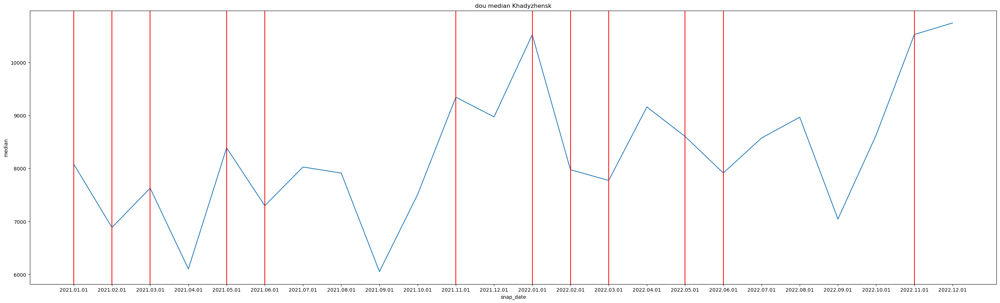

Графики для Yuriev-Polsky


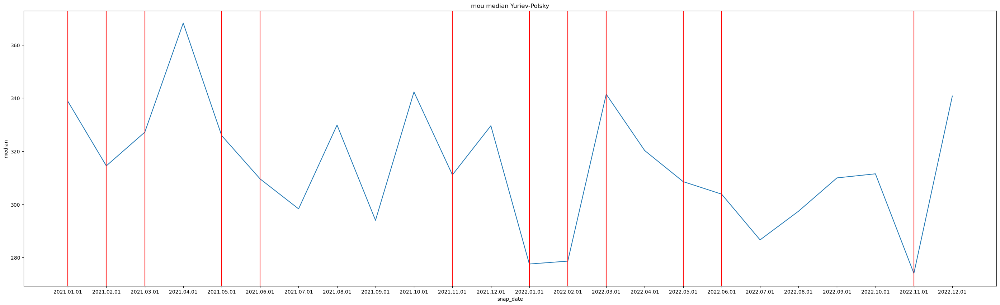

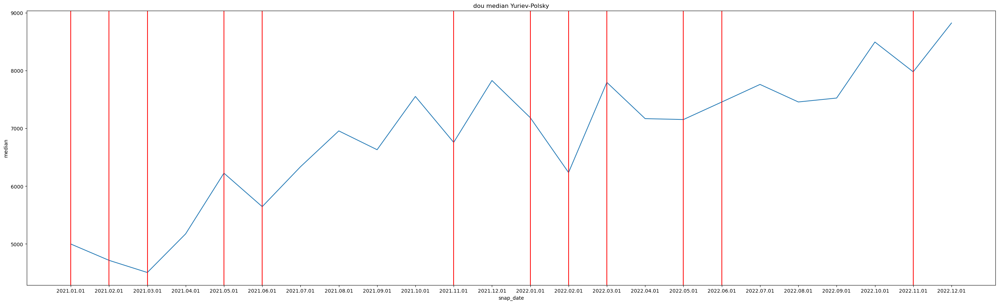

In [21]:
from matplotlib.pyplot import figure


def get_mou_mou_out_dou_plots_for_city(df, city): 
    aggregate_funcs = ['mean', 'median', 'sum']
    gr_df = df.groupby('snap_date').agg(
        {
        'mou': aggregate_funcs,
        'mou_out': aggregate_funcs,
        'dou' : aggregate_funcs
        }
    )
    print(f"Графики для {city}")
    figure(figsize=(35, 10), dpi=100)
    sns.lineplot(y=gr_df['mou']['median'], x=gr_df.index).set(title=f'mou median {city}')
    for i in h_dates:
        plt.axvline(x = i, color = 'red')
    plt.show()
#     figure(figsize=(35, 10), dpi=100)
#     sns.lineplot(y=gr_df['mou_out']['median'], x=gr_df.index).set(title=f'mou_out median for {city}')
#     plt.show()
    figure(figsize=(35, 10), dpi=100)
    sns.lineplot(y=gr_df['dou']['median'], x=gr_df.index).set(title=f'dou median {city}')
    for i in h_dates:
        plt.axvline(x = i, color = 'red')
    plt.show()
    


for city in eng_cities:
    get_mou_mou_out_dou_plots_for_city(globals()[city], city)

На всех рядах наблюдаются следующие тенденции: все ряды связанные с звонками имеют тренды на снижение, когда ряды связанные с интернет-трафиком в свою очередь имеют тренд на рост.

Никакой зависимости между праздниками и использованием мобильными услугами обнаружено не было.

Ряды с аггрегированной суммой на звонках и интернете выводить нет смысла, потому что они дублируют с другим масштабом графики связанные с числом уникальных пользователей на месяц(что впринципе очевидно - чем больше пользователей, тем больше сумма)

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


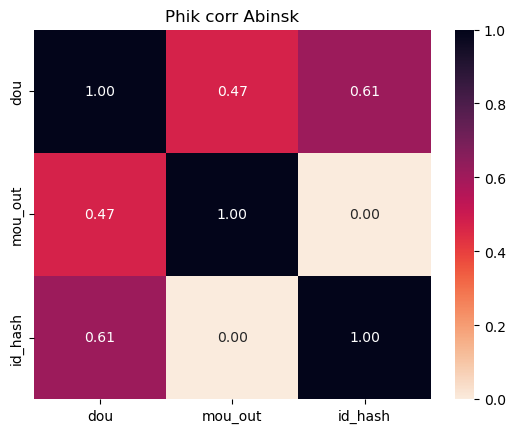

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


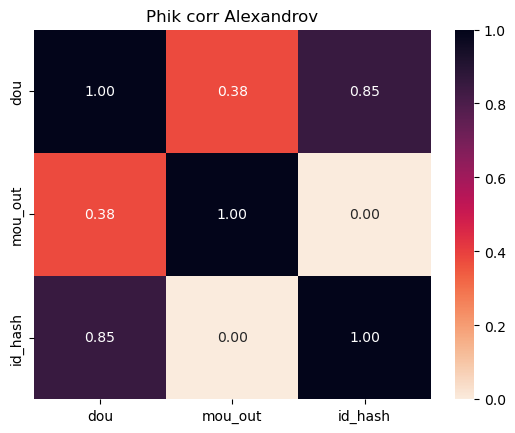

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


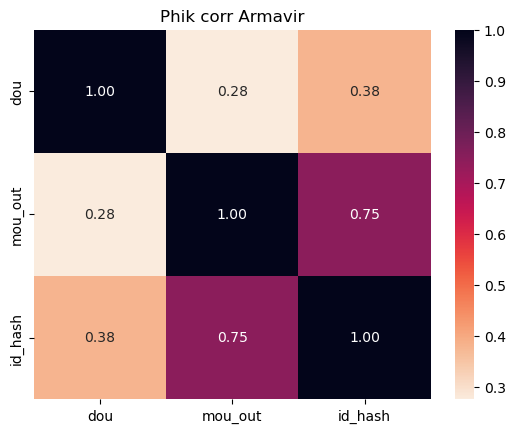

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


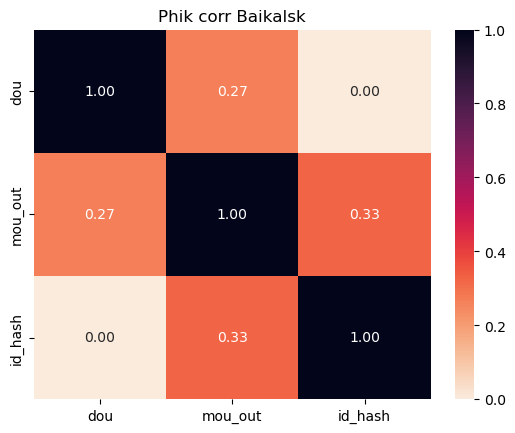

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


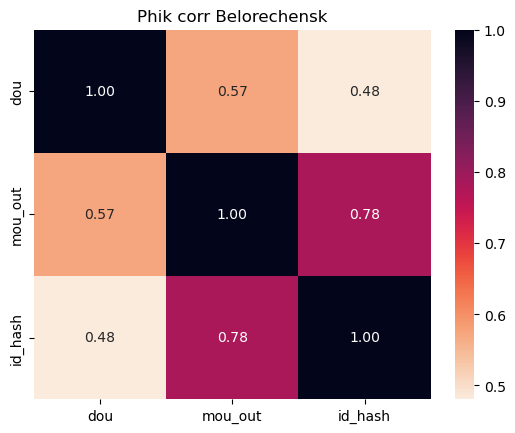

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


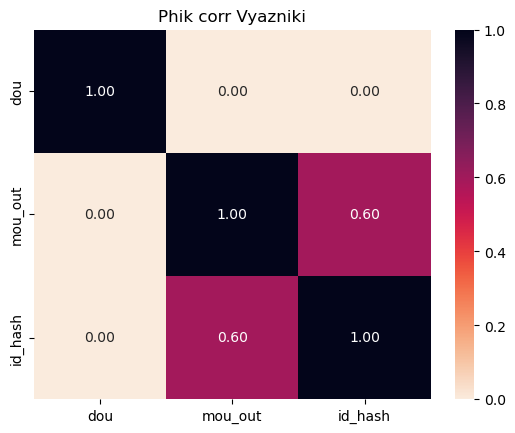

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


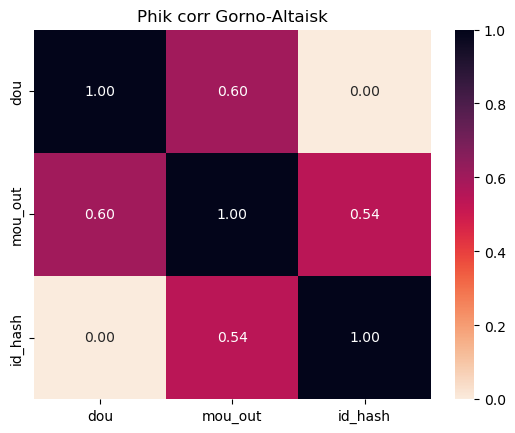

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


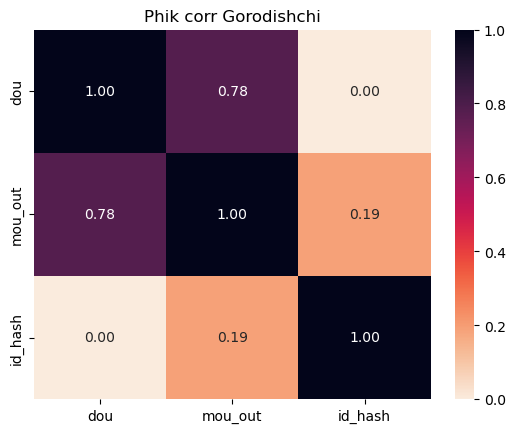

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


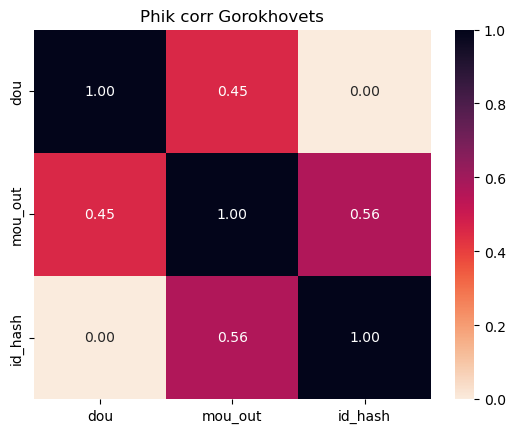

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


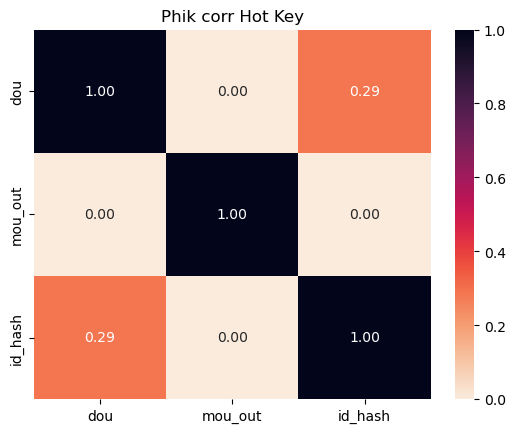

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


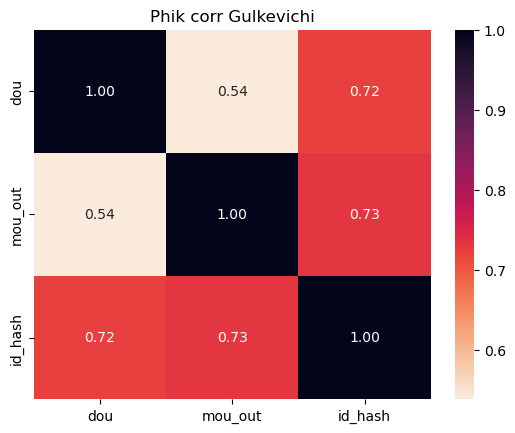

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


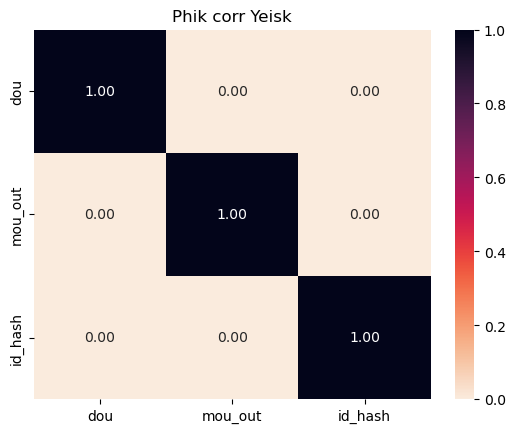

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


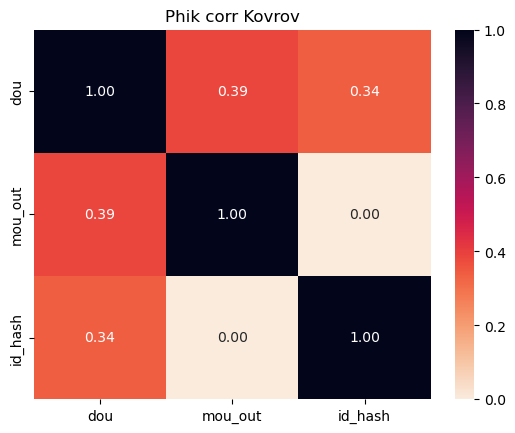

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


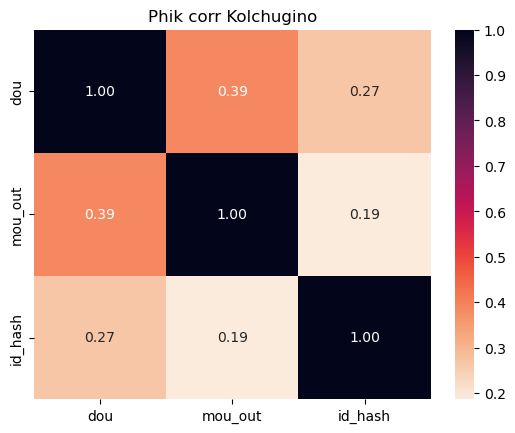

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


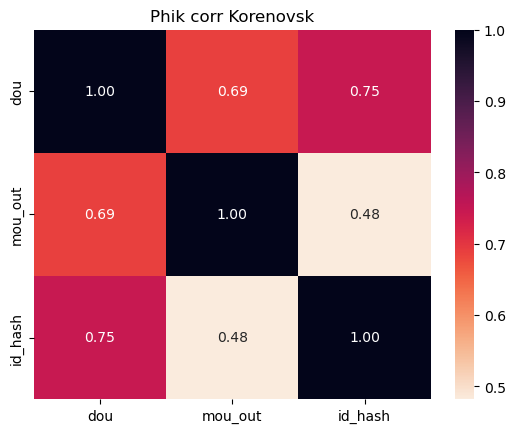

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


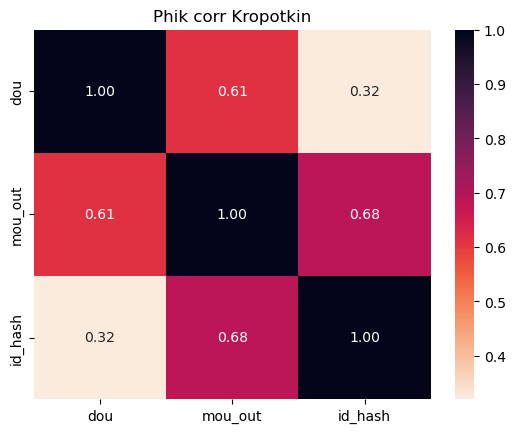

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


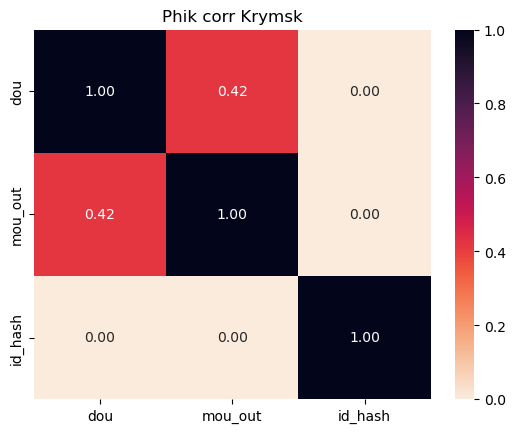

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


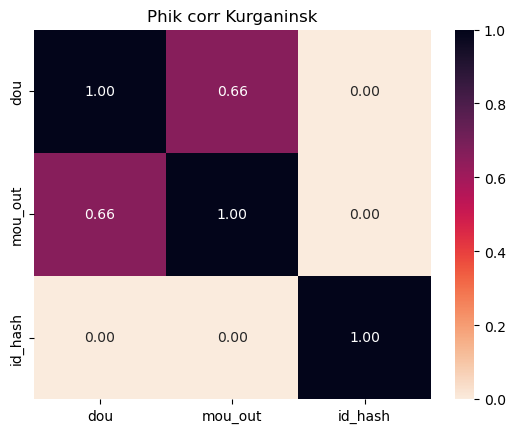

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


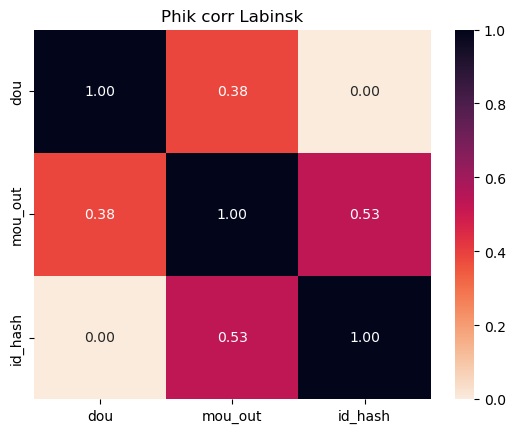

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


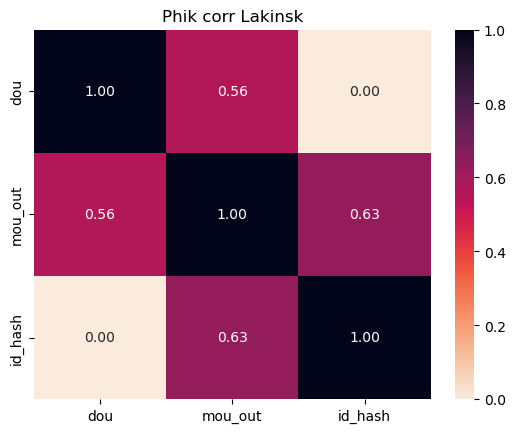

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


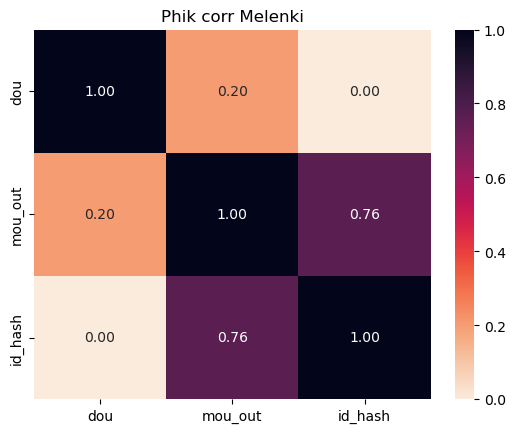

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


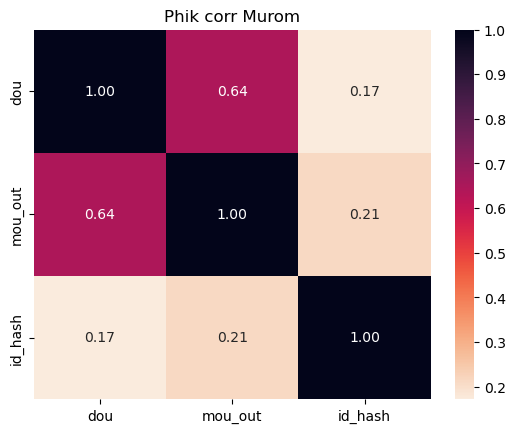

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


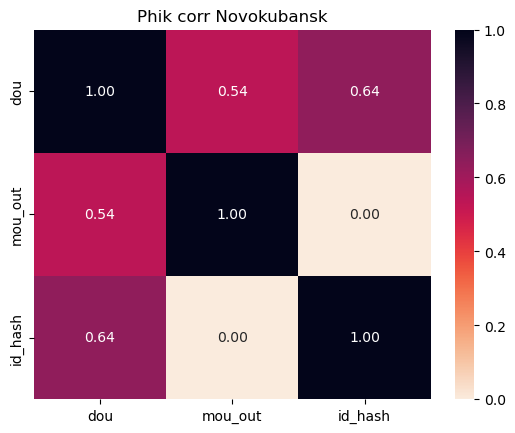

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


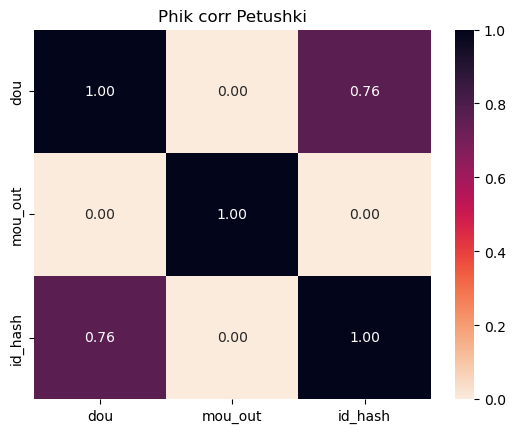

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


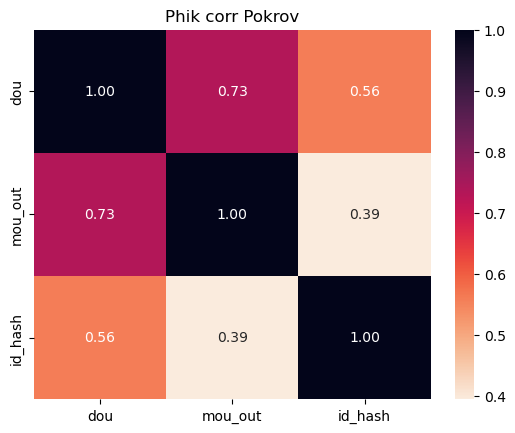

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


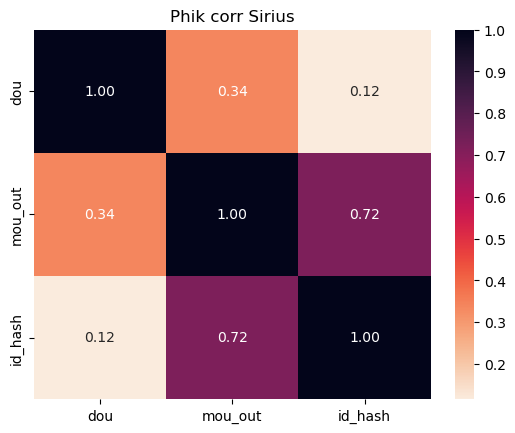

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


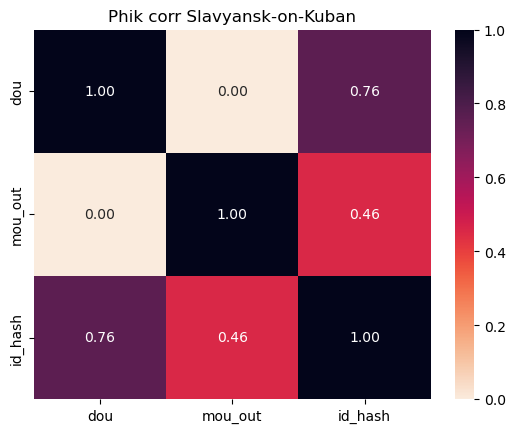

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


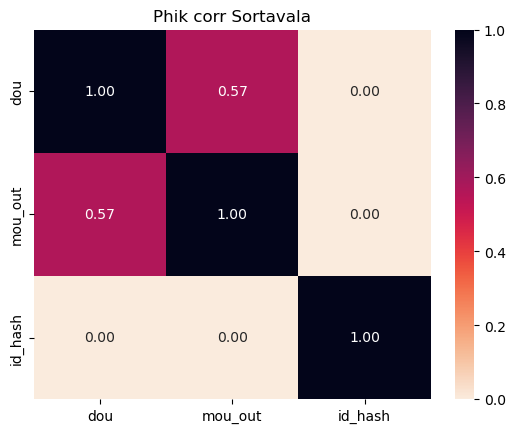

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


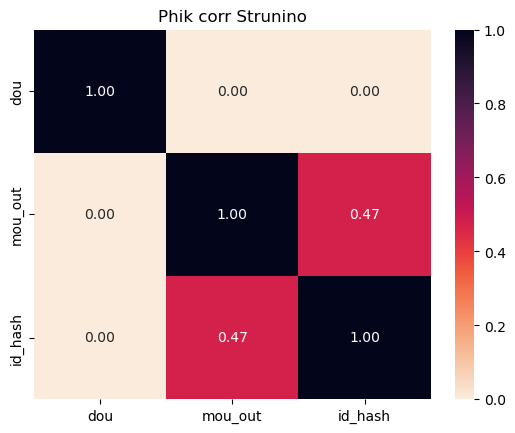

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


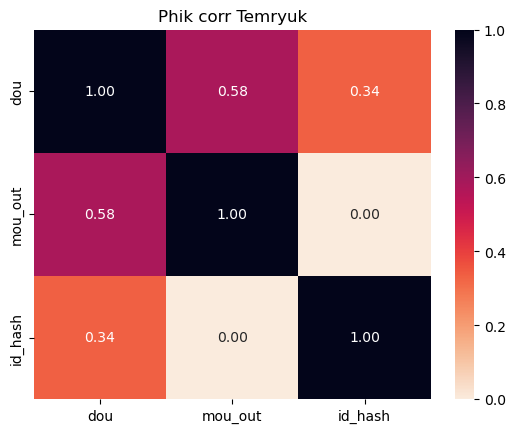

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


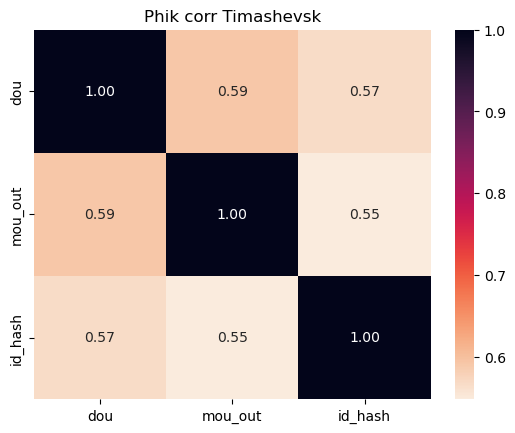

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


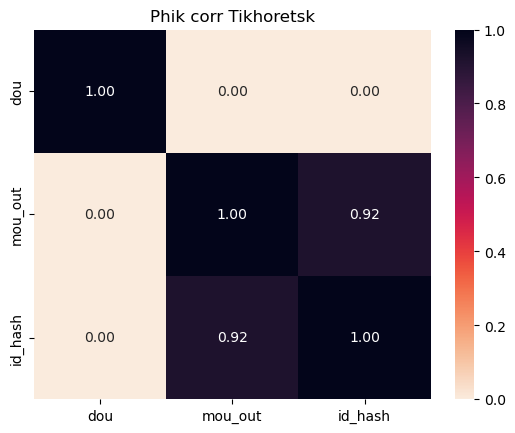

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


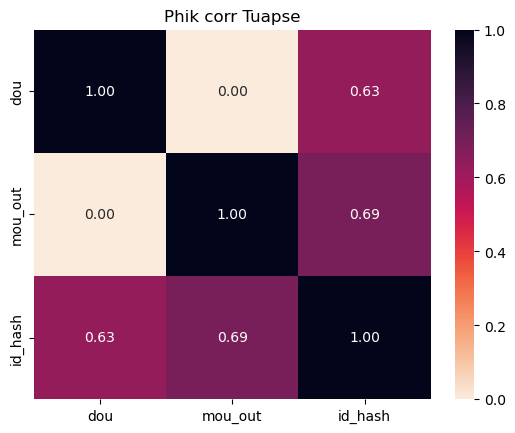

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


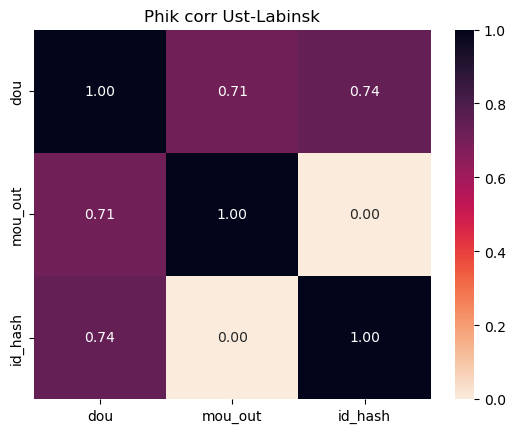

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


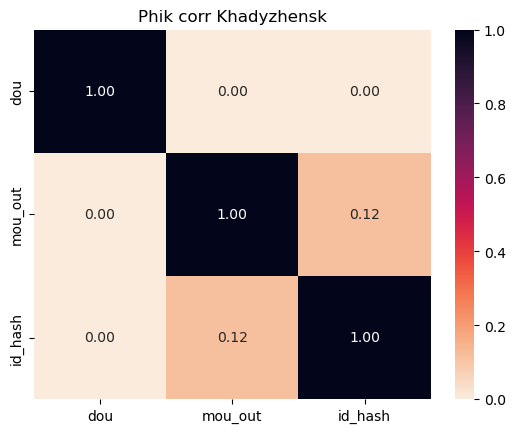

interval columns not set, guessing: ['dou', 'mou_out', 'id_hash']


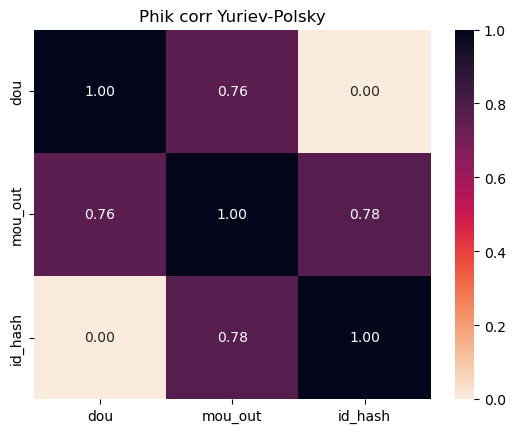

In [22]:
import phik
from phik.report import plot_correlation_matrix

    
def get_mou_mou_out_dou_plots_for_city(df, city): 
    gr_df = df.groupby('snap_date').agg(
        {
        'dou': 'median',
        'mou_out': 'median',
        'id_hash': pd.Series.nunique,
        }
    )
    corr_matrix = gr_df.phik_matrix()
    sns.heatmap(corr_matrix, annot=True, cmap='rocket_r', fmt=".2f").set(title=f'Phik corr {city}')
    plt.show()

    
for city in eng_cities:
    get_mou_mou_out_dou_plots_for_city(globals()[city], city)

# Создадим Обучающую выборку и интерполируем значения дней


Для начала возьмем пользователей, которые были в отпуске от 4 до 30 дней (в отчете артема писалось про 4-22, но можно попробовать разные интервалы)

In [23]:
df_new = df[(df['days'] >= 4) & (df['days'] <= 30)]

In [24]:
X_list = []

agg_funcs = [
    'sum',
    'mean',
    'median',
    'var',
]

for city in eng_cities:
    new_df = globals()[city].groupby('snap_date_datetime').agg(
            {
            'id_hash': pd.Series.nunique,
            'mou': agg_funcs,
            'mou_out': agg_funcs,
            'dou': agg_funcs
            }
        )
    new_df.columns = new_df.columns.droplevel(0)
    new_df.columns = [
        'id_hash',
        'mou_sum',
        'mou_mean',
        'mou_median',
        'mou_var',
        'mou_out_sum',
        'mou_out_mean',
        'mou_out_median',
        'mou_out_var',
        'dou_sum',
        'dou_mean',
        'dou_median',
        'dou_var',
    ]
    new_df.name = f'{city}_prepare'
    X_list.append(new_df)


Сделаем линейную интерполяцию(потом, если не лень можно попробовать СВД, КНН и АЛС)

In [25]:
X_interpolated = []

for df in X_list:
    range_dates_for_inerpolation = pd.date_range(start='2021-01-01', end='2022-12-01')
    test_int = pd.DataFrame(index=range_dates_for_inerpolation)
    test_int_df = pd.merge(test_int, df, how="left", left_index=True, right_index=True)
    df_interpolated = test_int_df.interpolate()
    df_interpolated.name = df.name
    X_interpolated.append(df_interpolated)

Посмотрим на наши ряды

In [26]:
for df in X_interpolated[:5]:
    print(df.shape)

(700, 13)
(700, 13)
(700, 13)
(700, 13)
(700, 13)


Abinsk_prepare


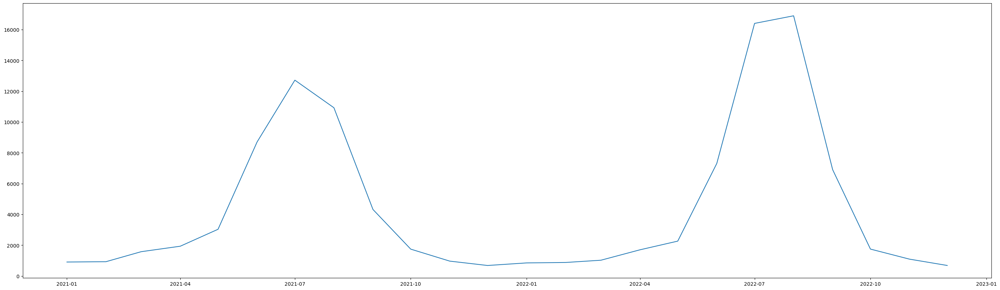

Alexandrov_prepare


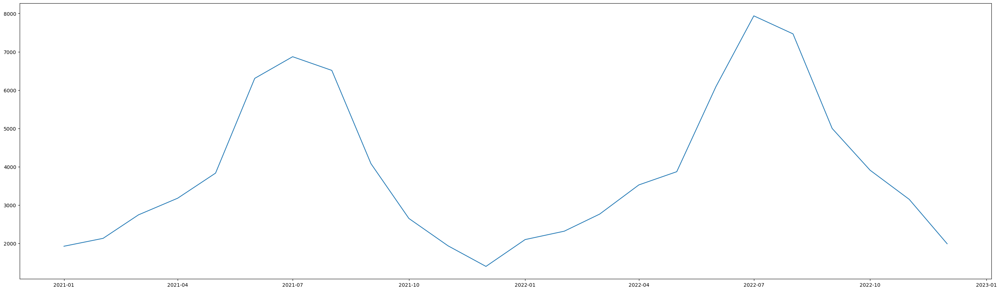

Armavir_prepare


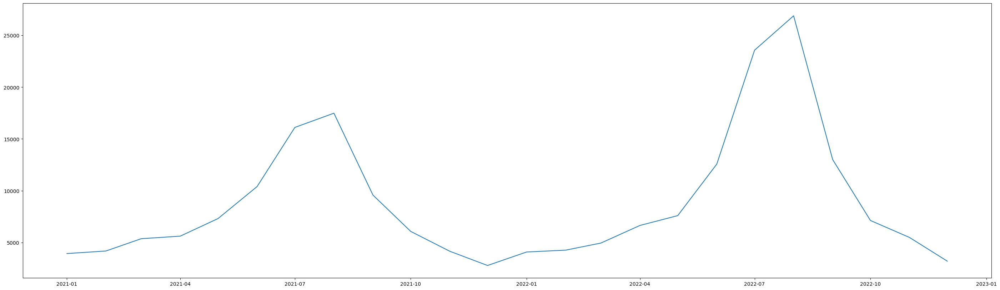

Baikalsk_prepare


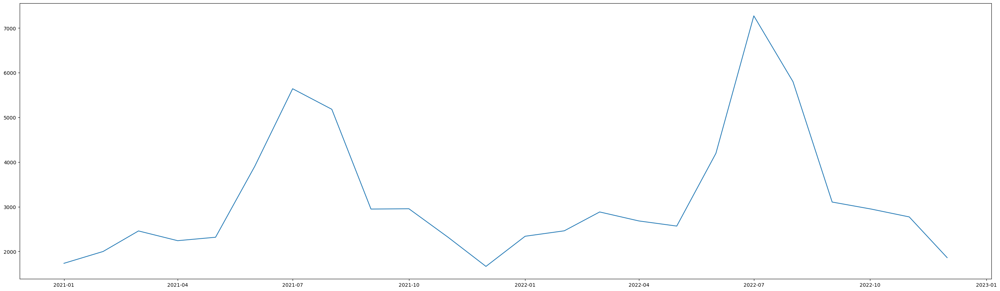

Belorechensk_prepare


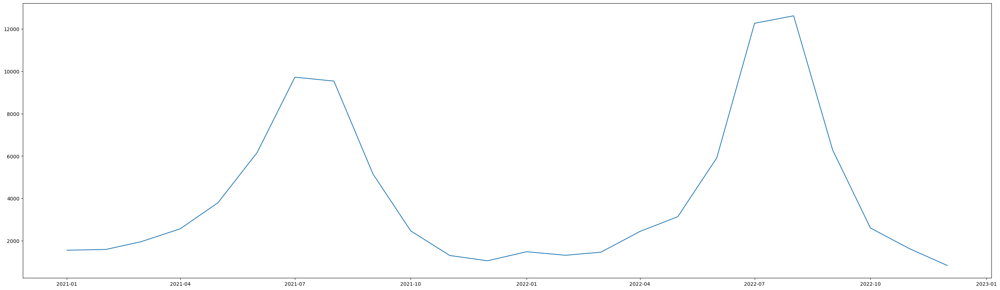

36


In [27]:
for df in X_interpolated[:5]:
    print(df.name)
    figure(figsize=(35, 10), dpi=100)
    plt.plot(df['id_hash'])
    plt.show()
    
print(len(X_interpolated))

In [28]:
!mkdir train

In [29]:
dir_path = '/kaggle/working/train'
for df in X_interpolated:
    df.to_csv(f"{dir_path}_{df.name}.csv")

In [30]:
# pd.read_csv('/kaggle/working/train_Yuriev-Polsky_prepare.csv', index_col="Unnamed: 0")